In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import KernelDensity
from sklearn.preprocessing import LabelEncoder, StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.cluster import KMeans
from kneed import KneeLocator
from sklearn.neighbors import LocalOutlierFactor
from sklearn.neighbors import NearestNeighbors
from pyod.models.abod import ABOD

In [84]:
df = pd.read_csv('Data.csv')

In [3]:
pd.set_option('display.max_columns', 24)
df.head()

,Ware_house_ID,WH_Manager_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
0,WH_100000,EID_50000,Urban,Small,West,Zone 6,3,1,2,4651,Rented,24,0,1,1,91,29.0,NaN,13,0,A,5,15,17115
1,WH_100001,EID_50001,Rural,Large,North,Zone 5,0,0,4,6217,Company Owned,47,0,0,1,210,31.0,NaN,4,0,A,3,17,5074
2,WH_100002,EID_50002,Rural,Mid,South,Zone 2,1,0,4,4306,Company Owned,64,0,0,0,161,37.0,NaN,17,0,A,6,22,23137
3,WH_100003,EID_50003,Rural,Mid,North,Zone 3,7,4,2,6000,Rented,50,0,0,0,103,21.0,NaN,17,1,A+,3,27,22115
4,WH_100004,EID_50004,Rural,Large,North,Zone 5,3,1,2,4740,Company Owned,42,1,0,1,112,25.0,2009.0,18,0,C,6,24,24071


In [4]:
df['flood_impacted'].value_counts()

0    22546
1     2454
Name: flood_impacted, dtype: int64

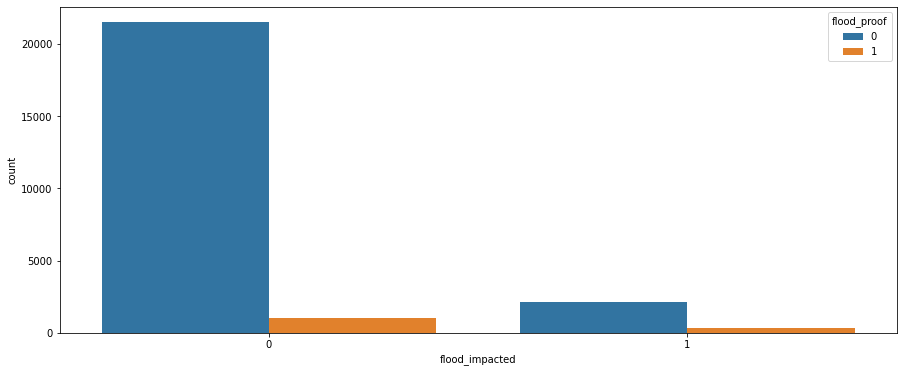

In [5]:
plt.figure(figsize=(15, 6))
sns.countplot(data=df, x='flood_impacted', hue='flood_proof')
plt.show()

In [6]:
df.groupby('flood_impacted')['flood_proof'].value_counts(normalize=True)

flood_impacted  flood_proof
0               0              0.953384
                1              0.046616
1               0              0.871638
                1              0.128362
Name: flood_proof, dtype: float64

In [7]:
df.loc[(df['flood_impacted'] == 1) & 
       (df['flood_proof'] == 0) & 
       (df['Location_type'] == 'Rural'),
       ['zone', 'WH_regional_zone']].value_counts()

zone   WH_regional_zone
North  Zone 6              352
West   Zone 6              197
North  Zone 5              159
West   Zone 4              148
North  Zone 4              109
South  Zone 2              109
       Zone 6              103
West   Zone 5              101
North  Zone 1               83
South  Zone 5               77
       Zone 3               74
       Zone 4               72
North  Zone 2               71
       Zone 3               69
South  Zone 1               59
West   Zone 3               58
       Zone 2               49
       Zone 1               38
East   Zone 4                9
       Zone 5                7
       Zone 3                4
       Zone 6                4
       Zone 1                2
dtype: int64

In [8]:
region_wise_prd_wt = df.loc[(df['flood_impacted'] == 1) & 
       (df['flood_proof'] == 0) & 
       (df['Location_type'] == 'Rural'),
       ['zone', 'WH_regional_zone', 'product_wg_ton']]
region_wise_prd_wt

,zone,WH_regional_zone,product_wg_ton
4,North,Zone 5,24071
16,West,Zone 4,12127
28,North,Zone 6,3123
58,South,Zone 1,32057
90,West,Zone 4,18117
...,...,...,...
24924,North,Zone 6,5120
24941,West,Zone 6,30070
24955,South,Zone 1,12113
24986,West,Zone 6,6102


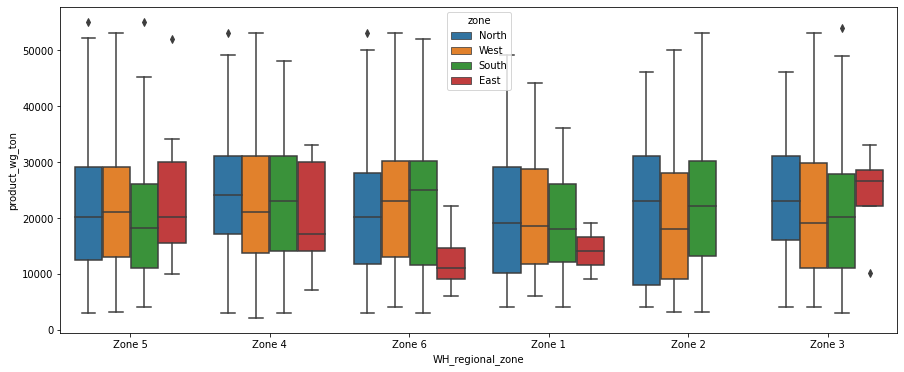

In [9]:
plt.figure(figsize=(15, 6))
sns.boxplot(data=region_wise_prd_wt, x='WH_regional_zone', y='product_wg_ton', hue='zone')
plt.show()

In [10]:
df.loc[(df['product_wg_ton'] >= 50000) & (df['Location_type'] == 'Rural') & 
       (df['zone'] == 'North') & (df['WH_regional_zone'] == 'Zone 5'), :]

,Ware_house_ID,WH_Manager_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
204,WH_100204,EID_50204,Rural,Large,North,Zone 5,2,0,4,4513,Company Owned,53,0,0,0,170,27.0,NaN,38,0,A+,2,24,51147
1529,WH_101529,EID_51529,Rural,Large,North,Zone 5,7,0,2,8355,Company Owned,44,0,0,0,226,25.0,2001.0,37,1,A+,3,14,52097
2270,WH_102270,EID_52270,Rural,Large,North,Zone 5,4,0,2,4600,Rented,26,0,0,0,264,20.0,2000.0,37,1,A+,5,10,52089
2487,WH_102487,EID_52487,Rural,Large,North,Zone 5,1,2,2,4861,Company Owned,26,0,0,1,83,24.0,NaN,39,1,A+,5,17,51094
2971,WH_102971,EID_52971,Rural,Large,North,Zone 5,4,0,3,4791,Company Owned,42,1,0,1,249,26.0,2000.0,37,1,A+,4,14,52136
3212,WH_103212,EID_53212,Rural,Large,North,Zone 5,7,0,2,6223,Rented,44,0,0,1,87,38.0,2004.0,39,1,B+,2,24,50074
3330,WH_103330,EID_53330,Rural,Large,North,Zone 5,8,0,4,5258,Company Owned,57,1,0,1,67,23.0,2001.0,39,1,B+,4,24,51086
3826,WH_103826,EID_53826,Rural,Large,North,Zone 5,3,0,4,4395,Rented,65,0,0,1,260,24.0,2001.0,37,0,C,6,17,50107
4567,WH_104567,EID_54567,Rural,Large,North,Zone 5,5,0,4,5702,Company Owned,65,0,0,1,229,31.0,2000.0,37,1,A,4,14,52064
4662,WH_104662,EID_54662,Rural,Large,North,Zone 5,7,0,4,5779,Rented,58,0,0,1,141,37.0,1997.0,38,0,C,6,24,51151


In [11]:
df.loc[(df['flood_impacted'] == 1) & 
       (df['flood_proof'] == 1) & 
       (df['Location_type'] == 'Rural'),
       ['zone', 'WH_regional_zone']].value_counts()

zone   WH_regional_zone
North  Zone 6              54
West   Zone 6              29
       Zone 4              28
South  Zone 6              22
North  Zone 5              19
West   Zone 5              17
North  Zone 3              15
       Zone 2              14
South  Zone 4              14
       Zone 5              14
       Zone 2              11
North  Zone 4              10
West   Zone 3               9
South  Zone 3               8
       Zone 1               8
North  Zone 1               7
West   Zone 2               6
       Zone 1               5
East   Zone 3               2
dtype: int64

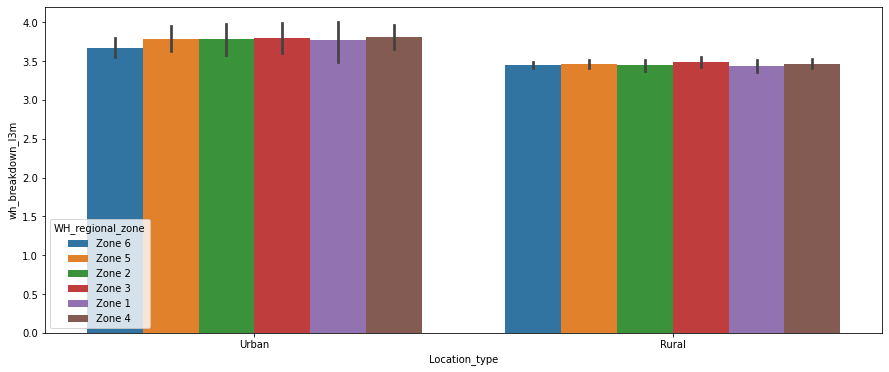

In [12]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df, x='Location_type', y='wh_breakdown_l3m', hue='WH_regional_zone')
plt.show()

In [13]:
df.groupby(['Location_type', 'zone', 'WH_regional_zone'])['wh_breakdown_l3m'].agg(['mean', 'count'])

mean  count
Location_type zone  WH_regional_zone                 
Rural         East  Zone 1            3.567568     37
                    Zone 3            3.570000    100
                    Zone 4            3.484848    132
                    Zone 5            3.642857     70
                    Zone 6            3.392857     56
              North Zone 1            3.459288    786
                    Zone 2            3.430396    783
                    Zone 3            3.532110    872
                    Zone 4            3.351679   1072
                    Zone 5            3.465645   1761
                    Zone 6            3.432380   4126
              South Zone 1            3.399054    634
                    Zone 2            3.479584   1347
                    Zone 3            3.395577    814
                    Zone 4            3.450617    810
                    Zone 5            3.472495   1018
                    Zone 6            3.434022   1258
              West  Zone 1            3.436807    451
                    Zone 2            3.392384    604
                    Zone 3            3.536643    846
                    Zone 4            3.545759   1792
                    Zone 5            3.447042   1369
                    Zone 6            3.484903   2219
Urban         East  Zone 1            2.666667      6
                    Zone 3            4.166667     12
                    Zone 4            3.700000     10
                    Zone 5            3.250000      4
                    Zone 6            2.500000      2
              North Zone 1            3.745455     55
                    Zone 2            3.718310     71
                    Zone 3            3.640449     89
                    Zone 4            3.877193    114
                    Zone 5            3.711538    156
                    Zone 6            3.697201    393
              South Zone 1            3.869565     46
                    Zone 2            3.835052     97
                    Zone 3            3.760563     71
                    Zone 4            3.722222     72
                    Zone 5            3.797753     89
                    Zone 6            3.547170    106
              West  Zone 1            3.846154     39
                    Zone 2            3.770492     61
                    Zone 3            3.935065     77
                    Zone 4            3.821839    174
                    Zone 5            3.883333    120
                    Zone 6            3.681564    179

<AxesSubplot:xlabel='Location_type,zone,WH_regional_zone,wh_breakdown_l3m'>

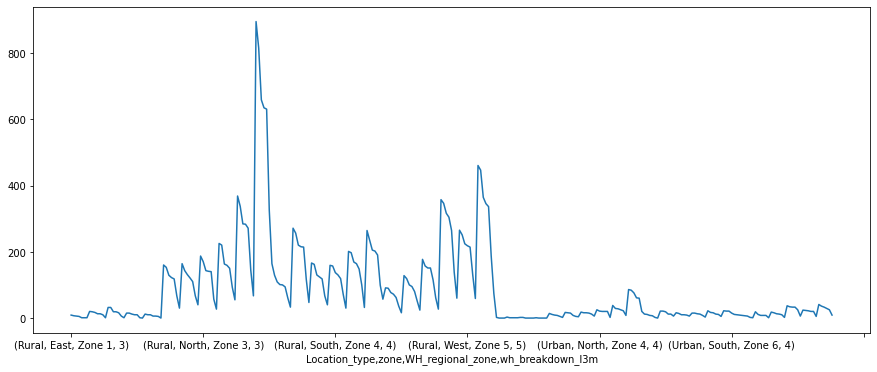

In [14]:
df.groupby(['Location_type', 'zone', 'WH_regional_zone'])['wh_breakdown_l3m'].value_counts().plot(figsize=(15, 6))

In [15]:
Q3 = np.quantile(df['workers_num'], 0.75)
Q1 = np.quantile(df['workers_num'], 0.25)
IQR = Q3 - Q1
lower_range = Q1 - (1.5 * IQR)
upper_range = Q3 + (1.5 * IQR)
no_outliers = df[(Q1 - 1.5*IQR < df.workers_num) &  (df.workers_num < Q3 + 1.5*IQR)]
outliers = df[(Q1 - 1.5*IQR >= df.workers_num) |  (df.workers_num >= Q3 + 1.5*IQR)]

In [16]:
outliers

,Ware_house_ID,WH_Manager_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton


In [17]:
num_cols = [col for col in df.columns if df[col].dtypes in ['int64', 'float64', 'int32']]

In [18]:
for col in num_cols:
    threshold = 3.5
    col_zscore = col +'_zscore'
    median_y = df.loc[:, col].median()
    median_absolute_deviation_y = (np.abs(df.loc[:, col] - median_y)).median()
    modified_z_scores = 0.7413 *((df.loc[:, col] - median_y)/median_absolute_deviation_y)
    df.loc[:, col_zscore] = np.abs(modified_z_scores)

In [19]:
df

,Ware_house_ID,WH_Manager_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,...,distributor_num_zscore,flood_impacted_zscore,flood_proof_zscore,electric_supply_zscore,dist_from_hub_zscore,workers_num_zscore,wh_est_year_zscore,storage_issue_reported_l3m_zscore,temp_reg_mach_zscore,wh_breakdown_l3m_zscore,govt_check_l3m_zscore,product_wg_ton_zscore
0,WH_100000,EID_50000,Urban,Small,West,Zone 6,3,1,2,4651,Rented,24,...,0.95310,NaN,inf,NaN,1.002128,0.14826,NaN,0.5295,NaN,1.4826,0.6354,0.412560
1,WH_100001,EID_50001,Rural,Large,North,Zone 5,0,0,4,6217,Company Owned,47,...,0.26475,NaN,NaN,NaN,0.631478,0.44478,NaN,1.4826,NaN,0.0000,0.4236,1.408875
2,WH_100002,EID_50002,Rural,Mid,South,Zone 2,1,0,4,4306,Company Owned,64,...,1.16490,NaN,NaN,inf,0.041183,1.33434,NaN,0.1059,NaN,2.2239,0.1059,0.085722
3,WH_100003,EID_50003,Rural,Mid,North,Zone 3,7,4,2,6000,Rented,50,...,0.42360,NaN,NaN,inf,0.837394,1.03782,NaN,0.1059,inf,0.0000,0.6354,0.001158
4,WH_100004,EID_50004,Rural,Large,North,Zone 5,3,1,2,4740,Company Owned,42,...,0.00000,inf,NaN,NaN,0.713844,0.44478,0.0000,0.0000,NaN,2.2239,0.3177,0.163005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,WH_124995,EID_74995,Rural,Small,North,Zone 1,3,0,4,5390,Rented,19,...,1.21785,NaN,NaN,NaN,0.302011,0.88956,0.4236,0.4236,inf,0.7413,0.9531,0.826774
24996,WH_124996,EID_74996,Rural,Mid,West,Zone 2,6,0,4,4490,Company Owned,57,...,0.79425,NaN,NaN,NaN,0.466744,0.00000,0.3177,0.8472,NaN,0.7413,0.3177,0.826360
24997,WH_124997,EID_74997,Urban,Large,South,Zone 5,7,0,2,5403,Rented,31,...,0.58245,inf,NaN,NaN,0.233372,NaN,NaN,0.5295,NaN,1.4826,0.4236,0.411980
24998,WH_124998,EID_74998,Rural,Small,North,Zone 1,1,0,2,10562,Rented,25,...,0.90015,NaN,NaN,NaN,1.427689,0.44478,NaN,0.0000,NaN,2.2239,0.9531,0.247569


In [20]:
pd.set_option('display.max_columns', 40)
df.head()

,Ware_house_ID,WH_Manager_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton,num_refill_req_l3m_zscore,transport_issue_l1y_zscore,Competitor_in_mkt_zscore,retail_shop_num_zscore,distributor_num_zscore,flood_impacted_zscore,flood_proof_zscore,electric_supply_zscore,dist_from_hub_zscore,workers_num_zscore,wh_est_year_zscore,storage_issue_reported_l3m_zscore,temp_reg_mach_zscore,wh_breakdown_l3m_zscore,govt_check_l3m_zscore,product_wg_ton_zscore
0,WH_100000,EID_50000,Urban,Small,West,Zone 6,3,1,2,4651,Rented,24,0,1,1,91,29.0,NaN,13,0,A,5,15,17115,0.37065,inf,0.7413,0.262675,0.95310,NaN,inf,NaN,1.002128,0.14826,NaN,0.5295,NaN,1.4826,0.6354,0.412560
1,WH_100001,EID_50001,Rural,Large,North,Zone 5,0,0,4,6217,Company Owned,47,0,0,1,210,31.0,NaN,4,0,A,3,17,5074,1.48260,NaN,0.7413,1.714967,0.26475,NaN,NaN,NaN,0.631478,0.44478,NaN,1.4826,NaN,0.0000,0.4236,1.408875
2,WH_100002,EID_50002,Rural,Mid,South,Zone 2,1,0,4,4306,Company Owned,64,0,0,0,161,37.0,NaN,17,0,A,6,22,23137,1.11195,NaN,0.7413,0.698363,1.16490,NaN,NaN,inf,0.041183,1.33434,NaN,0.1059,NaN,2.2239,0.1059,0.085722
3,WH_100003,EID_50003,Rural,Mid,North,Zone 3,7,4,2,6000,Rented,50,0,0,0,103,21.0,NaN,17,1,A+,3,27,22115,1.11195,inf,0.7413,1.440926,0.42360,NaN,NaN,inf,0.837394,1.03782,NaN,0.1059,inf,0.0000,0.6354,0.001158
4,WH_100004,EID_50004,Rural,Large,North,Zone 5,3,1,2,4740,Company Owned,42,1,0,1,112,25.0,2009.0,18,0,C,6,24,24071,0.37065,inf,0.7413,0.150281,0.00000,inf,NaN,NaN,0.713844,0.44478,0.0,0.0000,NaN,2.2239,0.3177,0.163005


In [21]:
df.loc[(df['Location_type'] == 'Rural') & (df['zone'] == 'East') & 
       (df['WH_regional_zone'] == 'Zone 1') & (df['product_wg_ton'] >= 35000), :]

,Ware_house_ID,WH_Manager_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton,num_refill_req_l3m_zscore,transport_issue_l1y_zscore,Competitor_in_mkt_zscore,retail_shop_num_zscore,distributor_num_zscore,flood_impacted_zscore,flood_proof_zscore,electric_supply_zscore,dist_from_hub_zscore,workers_num_zscore,wh_est_year_zscore,storage_issue_reported_l3m_zscore,temp_reg_mach_zscore,wh_breakdown_l3m_zscore,govt_check_l3m_zscore,product_wg_ton_zscore
86,WH_100086,EID_50086,Rural,Small,East,Zone 1,4,0,4,4564,Company Owned,56,0,1,1,160,37.0,1996.0,28,1,A+,5,31,39115,0.00000,NaN,0.7413,0.372544,0.74130,NaN,inf,NaN,0.054911,1.33434,1.3767,1.0590,inf,1.4826,1.059,1.407800
6557,WH_106557,EID_56557,Rural,Small,East,Zone 1,7,0,2,6721,Company Owned,27,0,0,1,65,40.0,2000.0,38,1,A+,2,31,50137,1.11195,NaN,0.7413,2.351449,0.79425,NaN,NaN,NaN,1.359050,1.77912,0.9531,2.1180,inf,0.7413,1.059,2.319800
15473,WH_115473,EID_65473,Rural,Small,East,Zone 1,8,0,2,3858,Company Owned,68,0,1,1,240,39.0,1998.0,31,1,A+,3,31,42090,1.48260,NaN,0.7413,1.264125,1.37670,NaN,inf,NaN,1.043311,1.63086,1.1649,1.3767,inf,0.0000,1.059,1.653962


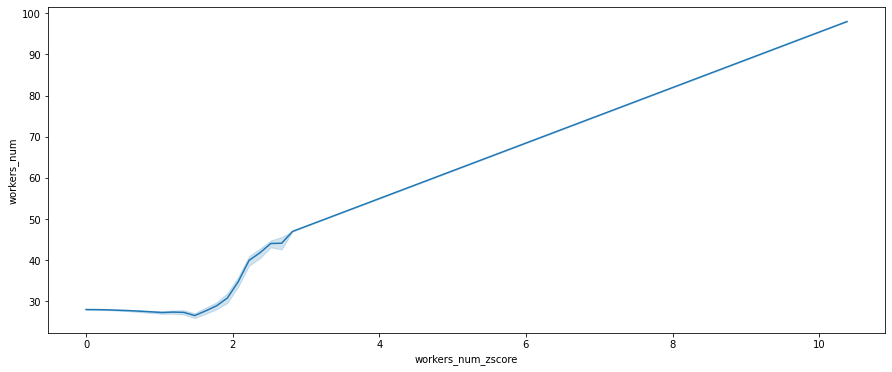

In [22]:
plt.figure(figsize=(15, 6))
sns.lineplot(data=df, x='workers_num_zscore', y='workers_num')
plt.show()

In [23]:
df.loc[df['workers_num_zscore'] >= 3.5, ['workers_num']].describe()

,workers_num
count,316.000000
mean,57.835443
std,8.238401
min,52.000000
25%,54.000000
50%,55.000000
75%,58.000000
max,98.000000


<AxesSubplot:ylabel='Frequency'>

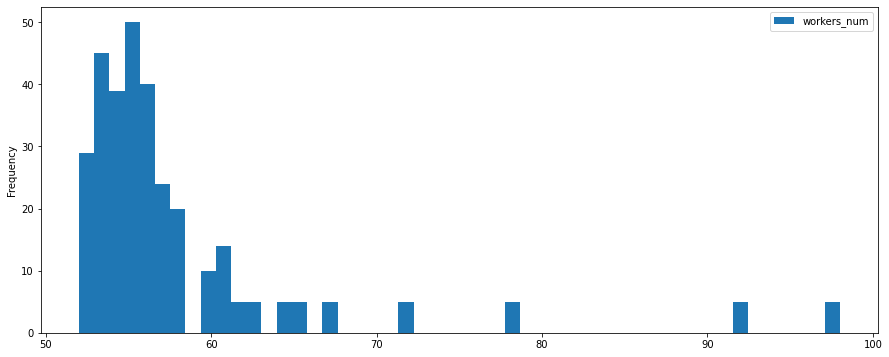

In [24]:
df.loc[df['workers_num_zscore'] >= 3.5, ['workers_num']].plot(kind='hist', figsize=(15, 6), bins=50)

In [101]:
df.loc[df['workers_num_zscore'] >= 3.5, ['Location_type', 'zone', 'WH_regional_zone', 'workers_num']]

,Location_type,zone,WH_regional_zone,workers_num
266,Rural,North,Zone 6,62.0
403,Rural,North,Zone 6,56.0
424,Rural,North,Zone 3,53.0
430,Rural,West,Zone 5,98.0
769,Rural,North,Zone 3,53.0
...,...,...,...,...
24649,Rural,North,Zone 6,52.0
24770,Rural,North,Zone 5,61.0
24780,Urban,South,Zone 3,55.0
24902,Rural,West,Zone 2,92.0


In [25]:
df.groupby(['Location_type', 'zone', 'WH_regional_zone'])['workers_num'].agg(['mean', 'count', 'median'])

mean  count  median
Location_type zone  WH_regional_zone                          
Rural         East  Zone 1            29.470588     34    26.5
                    Zone 3            28.260417     96    28.0
                    Zone 4            29.484127    126    29.0
                    Zone 5            28.735294     68    27.0
                    Zone 6            29.872727     55    29.0
              North Zone 1            29.435931    757    29.0
                    Zone 2            28.331995    747    28.0
                    Zone 3            28.948931    842    28.0
                    Zone 4            28.876209   1034    28.0
                    Zone 5            29.003576   1678    28.0
                    Zone 6            28.955152   3969    28.0
              South Zone 1            28.800659    607    28.0
                    Zone 2            29.033742   1304    28.0
                    Zone 3            28.512133    783    28.0
                    Zone 4            28.355670    776    28.0
                    Zone 5            29.283195    964    28.0
                    Zone 6            29.140017   1207    28.0
              West  Zone 1            29.053364    431    28.0
                    Zone 2            28.658163    588    28.0
                    Zone 3            29.238037    815    29.0
                    Zone 4            28.650729   1715    28.0
                    Zone 5            28.847843   1321    28.0
                    Zone 6            29.325964   2126    28.0
Urban         East  Zone 1            33.000000      6    33.0
                    Zone 3            27.636364     11    26.0
                    Zone 4            35.100000     10    33.0
                    Zone 5            26.500000      4    27.0
                    Zone 6            32.000000      2    32.0
              North Zone 1            27.518519     54    29.0
                    Zone 2            27.857143     70    27.5
                    Zone 3            30.395349     86    28.0
                    Zone 4            28.539823    113    29.0
                    Zone 5            28.870968    155    28.0
                    Zone 6            28.681818    374    27.5
              South Zone 1            28.622222     45    28.0
                    Zone 2            28.265957     94    28.0
                    Zone 3            30.400000     70    29.0
                    Zone 4            28.956522     69    28.0
                    Zone 5            27.729412     85    27.0
                    Zone 6            28.561224     98    27.5
              West  Zone 1            28.538462     39    27.0
                    Zone 2            30.203390     59    29.0
                    Zone 3            30.440000     75    29.0
                    Zone 4            28.475904    166    28.0
                    Zone 5            29.258929    112    29.0
                    Zone 6            28.723529    170    28.0

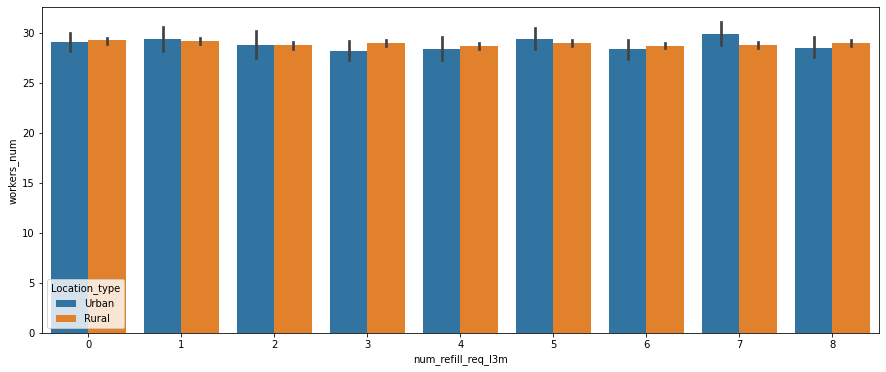

In [26]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df, x='num_refill_req_l3m', y='workers_num', hue='Location_type')
plt.show()

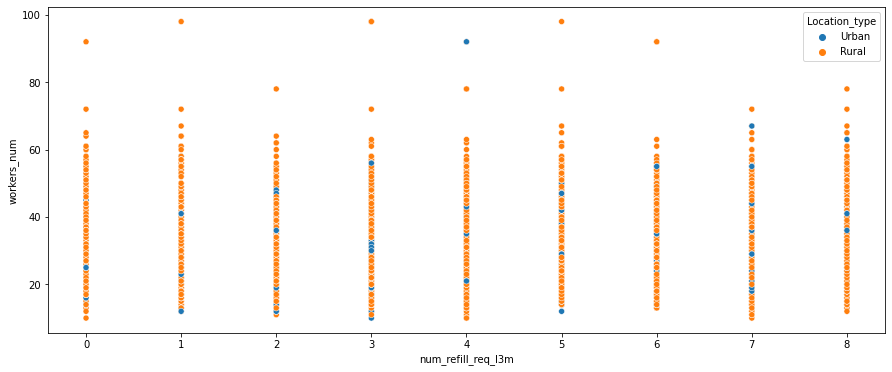

In [27]:
plt.figure(figsize=(15, 6))
sns.scatterplot(data=df, x='num_refill_req_l3m', y='workers_num', hue='Location_type')
plt.show()

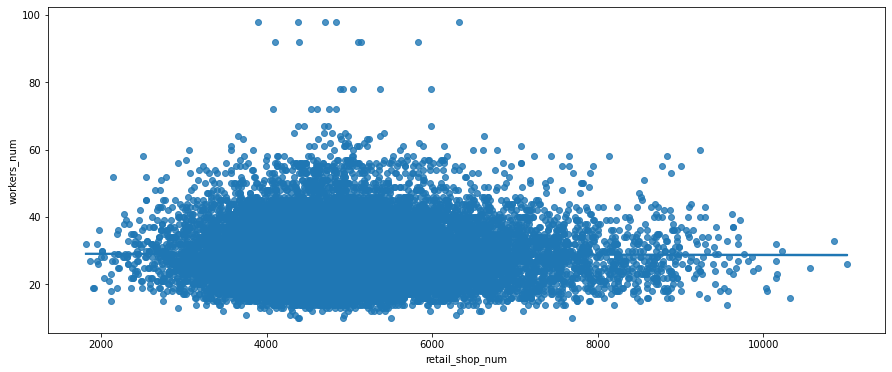

In [32]:
plt.figure(figsize=(15, 6))
sns.regplot(data=df, x='retail_shop_num', y='workers_num')
plt.show()

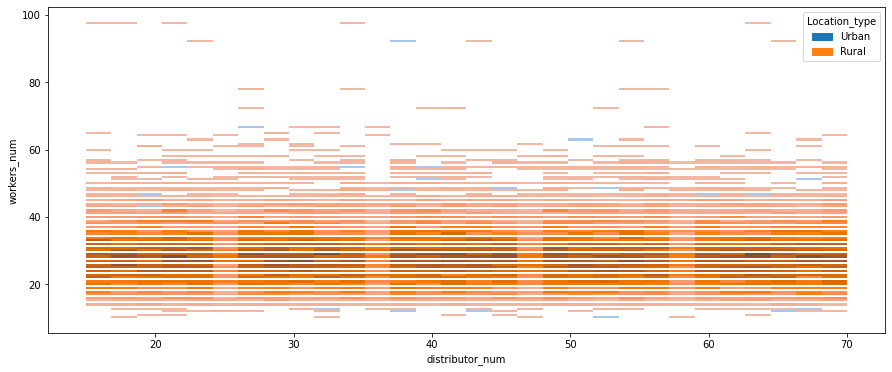

In [35]:
plt.figure(figsize=(15, 6))
sns.histplot(data=df, x='distributor_num', y='workers_num', hue='Location_type', kde=True)
plt.show()

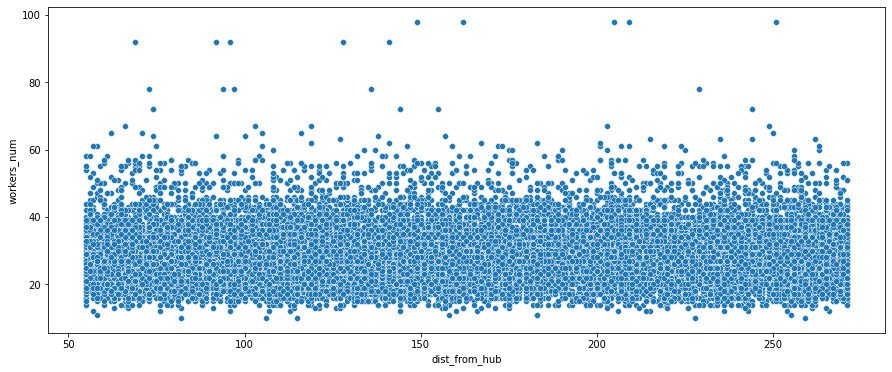

In [36]:
plt.figure(figsize=(15, 6))
sns.scatterplot(data=df, x='dist_from_hub', y='workers_num')
plt.show()

<AxesSubplot:ylabel='Frequency'>

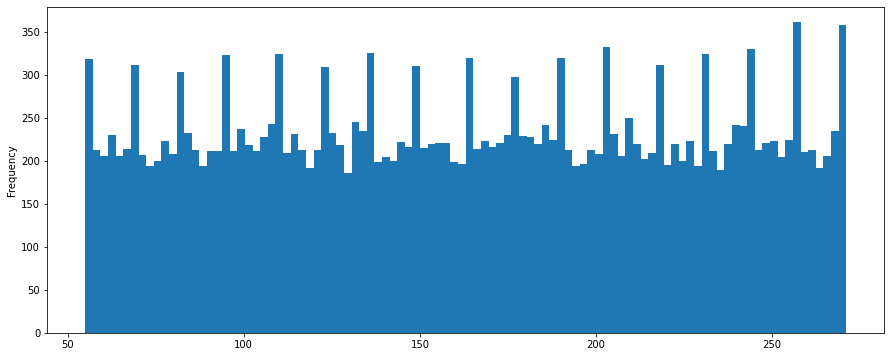

In [42]:
df.query("workers_num <= 45")['dist_from_hub'].plot(kind='hist', bins=100, figsize=(15, 6))

<AxesSubplot:ylabel='Frequency'>

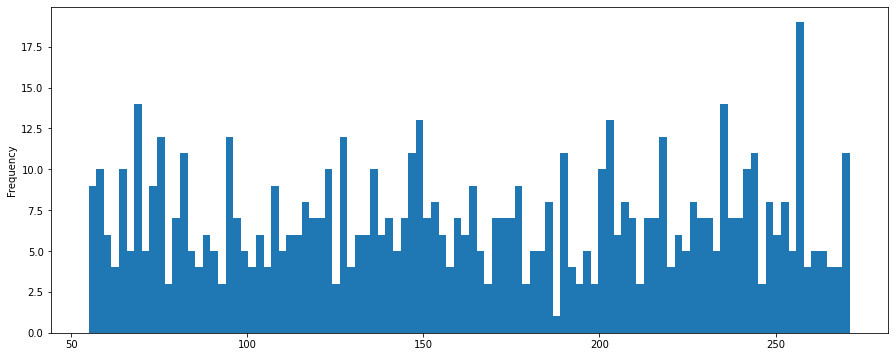

In [41]:
df.query("workers_num > 45")['dist_from_hub'].plot(kind='hist', bins=100, figsize=(15, 6))

<AxesSubplot:>

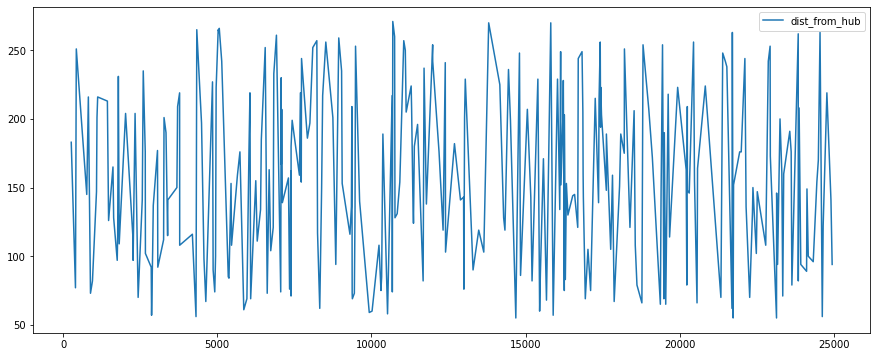

In [48]:
df.query("workers_num >= 52 & Location_type == 'Rural'")[['dist_from_hub', 'zone']].plot(figsize=(15, 6))

In [76]:
zone_N = df.loc[(df['Location_type'] == 'Rural') & (df['zone'] == 'North'), 
       ['dist_from_hub', 'WH_regional_zone']]
zone_N_lt52 = df.loc[(df['workers_num'] < 52) & (df['Location_type'] == 'Rural') & (df['zone'] == 'North'), 
       ['dist_from_hub', 'WH_regional_zone']]
zone_N_gt_52 = df.loc[(df['workers_num'] >= 52) & (df['Location_type'] == 'Rural') & (df['zone'] == 'North'), 
       ['dist_from_hub', 'WH_regional_zone']]

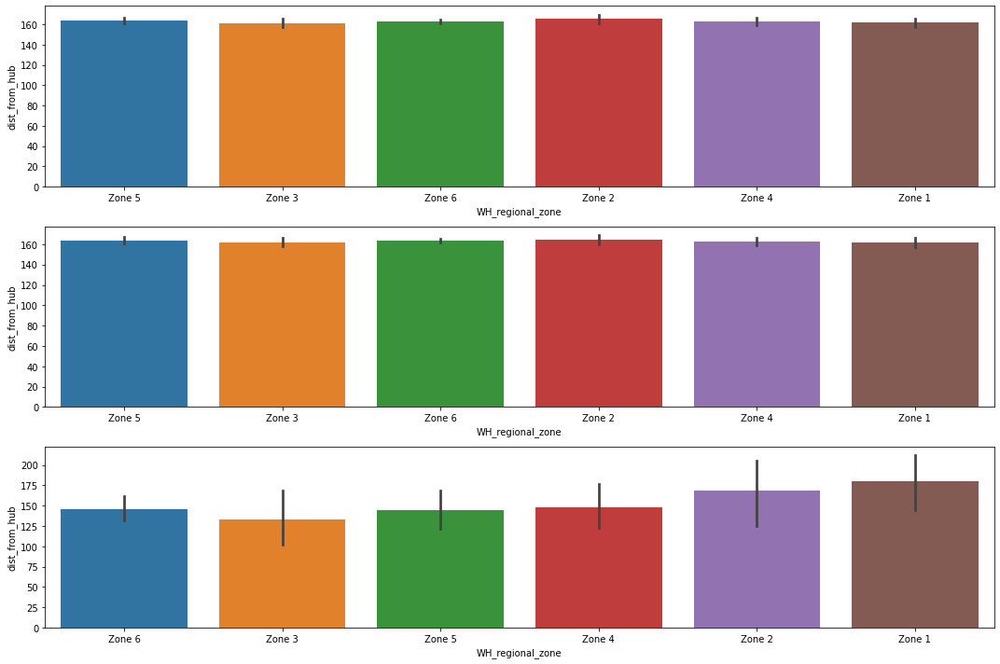

In [77]:
fig, ax = plt.subplots(3, 1, figsize=(15, 10))
sns.barplot(data=zone_N, x='WH_regional_zone', y='dist_from_hub', ax=ax[0])
sns.barplot(data=zone_N_lt52, x='WH_regional_zone', y='dist_from_hub', ax=ax[1])
sns.barplot(data=zone_N_gt_52, x='WH_regional_zone', y='dist_from_hub', ax=ax[2])
plt.tight_layout()
plt.show()

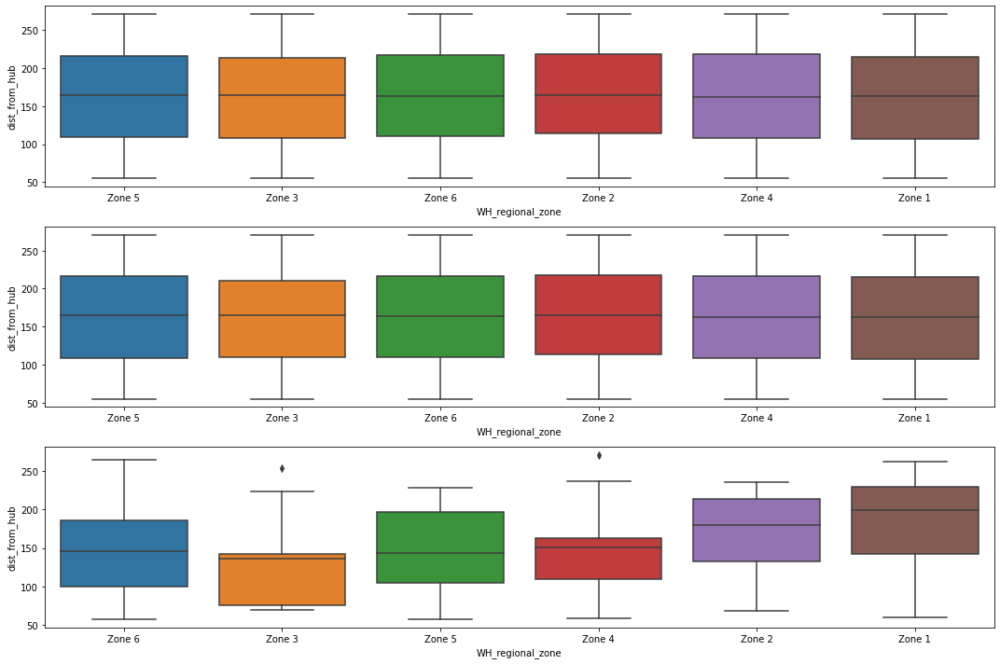

In [78]:
fig, ax = plt.subplots(3, 1, figsize=(15, 10))
sns.boxplot(data=zone_N, x='WH_regional_zone', y='dist_from_hub', ax=ax[0])
sns.boxplot(data=zone_N_lt52, x='WH_regional_zone', y='dist_from_hub', ax=ax[1])
sns.boxplot(data=zone_N_gt_52, x='WH_regional_zone', y='dist_from_hub', ax=ax[2])
plt.tight_layout()
plt.show()

In [68]:
zone_N = df.loc[(df['workers_num'] < 52) & (df['Location_type'] == 'Rural') & (df['zone'] == 'North'), 
       ['dist_from_hub', 'WH_regional_zone']]
zone_S = df.loc[(df['workers_num'] < 52) & (df['Location_type'] == 'Rural') & (df['zone'] == 'South'), 
       ['dist_from_hub', 'WH_regional_zone']]
zone_E = df.loc[(df['workers_num'] < 52) & (df['Location_type'] == 'Rural') & (df['zone'] == 'East'), 
       ['dist_from_hub', 'WH_regional_zone']]
zone_W = df.loc[(df['workers_num'] < 52) & (df['Location_type'] == 'Rural') & (df['zone'] == 'West'), 
       ['dist_from_hub', 'WH_regional_zone']]

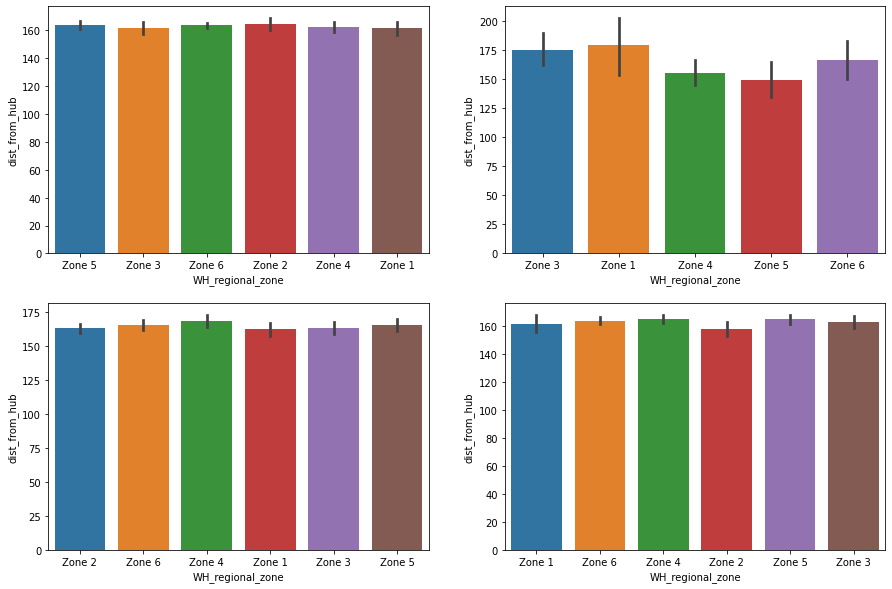

In [69]:
fig, ax = plt.subplots(2, 2, figsize=(15, 10))
sns.barplot(data=zone_N, x='WH_regional_zone', y='dist_from_hub', ax=ax[0][0])
sns.barplot(data=zone_S, x='WH_regional_zone', y='dist_from_hub', ax=ax[1][0])
sns.barplot(data=zone_E, x='WH_regional_zone', y='dist_from_hub', ax=ax[0][1])
sns.barplot(data=zone_W, x='WH_regional_zone', y='dist_from_hub', ax=ax[1][1])
plt.show()

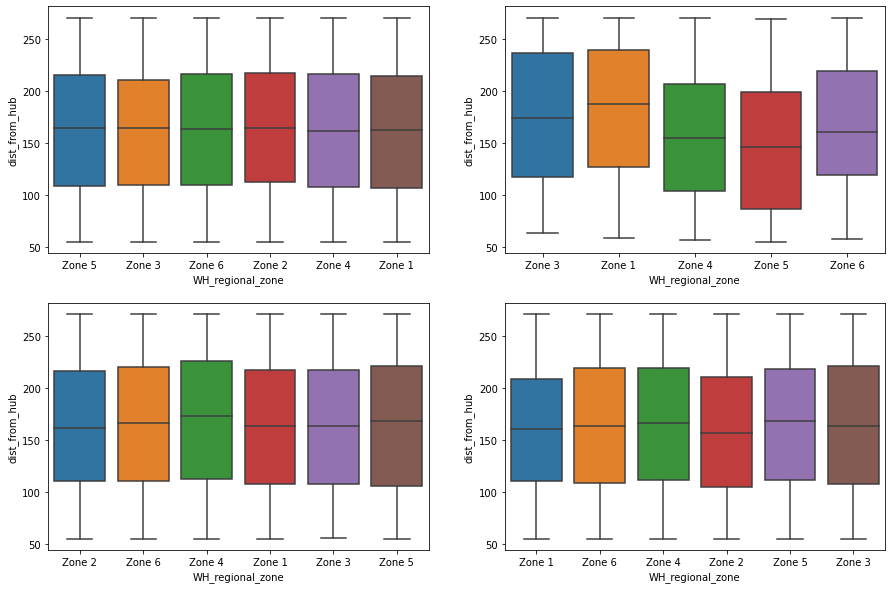

In [70]:
fig, ax = plt.subplots(2, 2, figsize=(15, 10))
sns.boxplot(data=zone_N, x='WH_regional_zone', y='dist_from_hub', ax=ax[0][0])
sns.boxplot(data=zone_S, x='WH_regional_zone', y='dist_from_hub', ax=ax[1][0])
sns.boxplot(data=zone_E, x='WH_regional_zone', y='dist_from_hub', ax=ax[0][1])
sns.boxplot(data=zone_W, x='WH_regional_zone', y='dist_from_hub', ax=ax[1][1])
plt.show()

In [63]:
zone_N = df.loc[(df['workers_num'] >= 52) & (df['Location_type'] == 'Rural') & (df['zone'] == 'North'), 
       ['dist_from_hub', 'WH_regional_zone']]
zone_S = df.loc[(df['workers_num'] >= 52) & (df['Location_type'] == 'Rural') & (df['zone'] == 'South'), 
       ['dist_from_hub', 'WH_regional_zone']]
zone_E = df.loc[(df['workers_num'] >= 52) & (df['Location_type'] == 'Rural') & (df['zone'] == 'East'), 
       ['dist_from_hub', 'WH_regional_zone']]
zone_W = df.loc[(df['workers_num'] >= 52) & (df['Location_type'] == 'Rural') & (df['zone'] == 'West'), 
       ['dist_from_hub', 'WH_regional_zone']]

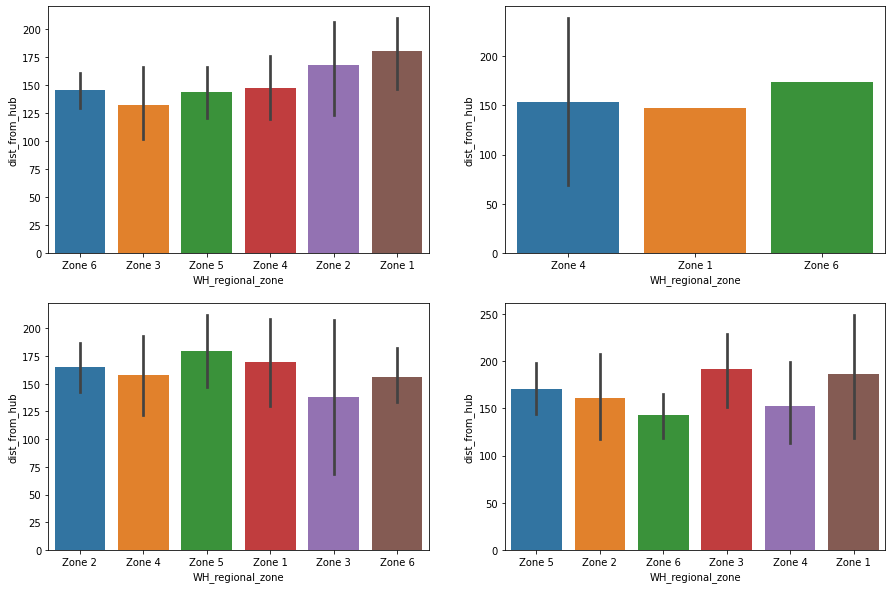

In [66]:
fig, ax = plt.subplots(2, 2, figsize=(15, 10))
sns.barplot(data=zone_N, x='WH_regional_zone', y='dist_from_hub', ax=ax[0][0])
sns.barplot(data=zone_S, x='WH_regional_zone', y='dist_from_hub', ax=ax[1][0])
sns.barplot(data=zone_E, x='WH_regional_zone', y='dist_from_hub', ax=ax[0][1])
sns.barplot(data=zone_W, x='WH_regional_zone', y='dist_from_hub', ax=ax[1][1])
plt.show()

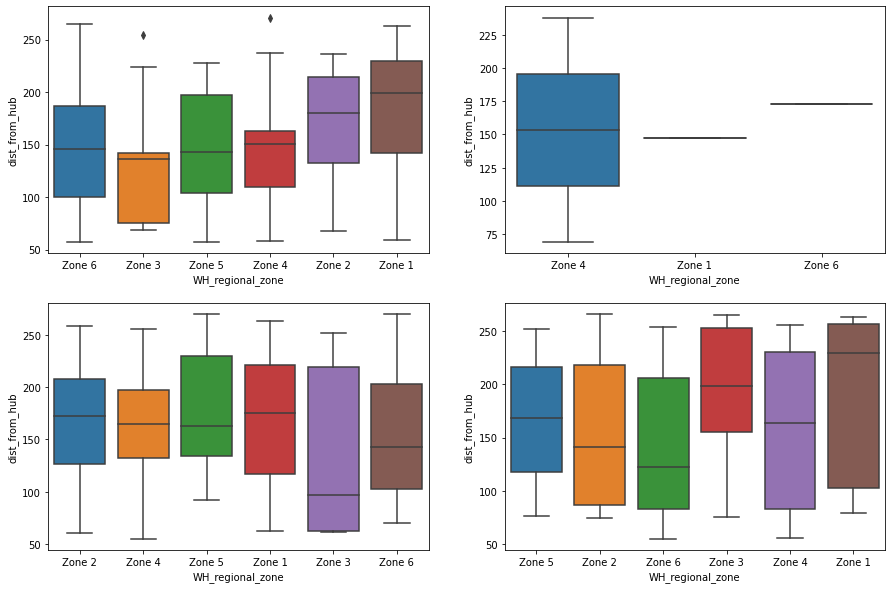

In [67]:
fig, ax = plt.subplots(2, 2, figsize=(15, 10))
sns.boxplot(data=zone_N, x='WH_regional_zone', y='dist_from_hub', ax=ax[0][0])
sns.boxplot(data=zone_S, x='WH_regional_zone', y='dist_from_hub', ax=ax[1][0])
sns.boxplot(data=zone_E, x='WH_regional_zone', y='dist_from_hub', ax=ax[0][1])
sns.boxplot(data=zone_W, x='WH_regional_zone', y='dist_from_hub', ax=ax[1][1])
plt.show()

<AxesSubplot:>

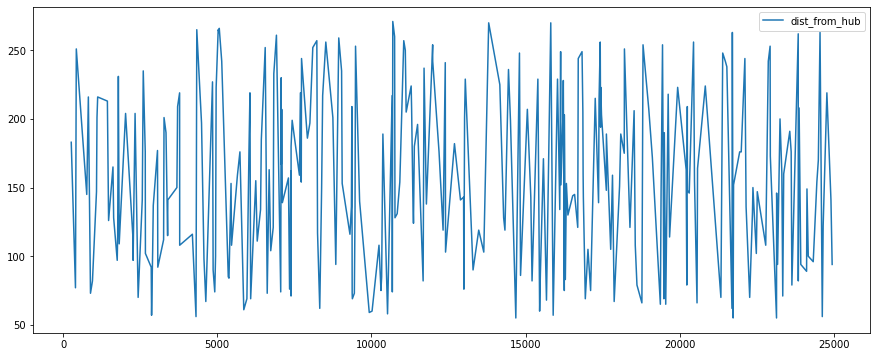

In [55]:
df.loc[(df['workers_num'] >= 52) & (df['Location_type'] == 'Rural'), 
       ['dist_from_hub', 'zone', 'WH_regional_zone']].plot(figsize=(15, 6))

In [29]:
df.loc[df['workers_num'] > 52, :]

,Ware_house_ID,WH_Manager_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton,num_refill_req_l3m_zscore,transport_issue_l1y_zscore,Competitor_in_mkt_zscore,retail_shop_num_zscore,distributor_num_zscore,flood_impacted_zscore,flood_proof_zscore,electric_supply_zscore,dist_from_hub_zscore,workers_num_zscore,wh_est_year_zscore,storage_issue_reported_l3m_zscore,temp_reg_mach_zscore,wh_breakdown_l3m_zscore,govt_check_l3m_zscore,product_wg_ton_zscore
266,WH_100266,EID_50266,Rural,Large,North,Zone 6,4,0,4,4943,Rented,30,0,0,1,183,62.0,2021.0,0,0,NaN,0,23,6123,0.00000,NaN,0.7413,0.106080,0.63540,NaN,NaN,NaN,0.260828,5.04084,1.2708,1.9062,NaN,2.2239,0.2118,1.322077
403,WH_100403,EID_50403,Rural,Large,North,Zone 6,1,0,2,5319,Rented,17,0,0,1,77,56.0,NaN,21,0,A+,4,28,30099,1.11195,NaN,0.7413,0.580917,1.32375,NaN,NaN,NaN,1.194317,4.15128,NaN,0.3177,NaN,0.7413,0.7413,0.661783
424,WH_100424,EID_50424,Rural,Mid,North,Zone 3,0,0,2,3081,Rented,56,0,0,1,224,53.0,NaN,28,0,A,2,27,38147,1.48260,NaN,0.7413,2.245369,0.74130,NaN,NaN,NaN,0.823667,3.70650,NaN,1.0590,NaN,0.7413,0.6354,1.327704
430,WH_100430,EID_50430,Rural,Large,West,Zone 5,3,0,4,3896,Rented,17,1,0,0,251,98.0,2009.0,16,1,B+,4,14,21144,0.37065,NaN,0.7413,1.216136,1.32375,inf,NaN,inf,1.194317,10.37820,0.0000,0.2118,inf,0.7413,0.7413,0.079186
769,WH_100769,EID_50769,Rural,Mid,North,Zone 3,1,0,2,5177,Rented,20,0,0,1,145,53.0,NaN,13,0,B,4,27,17142,1.11195,NaN,0.7413,0.401590,1.16490,NaN,NaN,NaN,0.260828,3.70650,NaN,0.5295,NaN,0.7413,0.6354,0.410326
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24621,WH_124621,EID_74621,Rural,Mid,West,Zone 4,3,0,3,5036,Company Owned,48,0,0,1,56,58.0,2010.0,22,1,B+,2,11,29063,0.37065,NaN,0.0000,0.223527,0.31770,NaN,NaN,NaN,1.482600,4.44780,0.1059,0.4236,inf,0.7413,1.0590,0.576061
24770,WH_124770,EID_74770,Rural,Large,North,Zone 5,5,1,3,7068,Rented,25,0,0,1,219,61.0,2015.0,11,0,A,3,17,15110,0.37065,inf,0.0000,2.789662,0.90015,NaN,NaN,NaN,0.755028,4.89258,0.6354,0.7413,NaN,0.0000,0.4236,0.578461
24780,WH_124780,EID_74780,Urban,Mid,South,Zone 3,6,0,3,4175,Company Owned,62,0,0,1,230,55.0,2007.0,19,0,C,6,19,24118,0.74130,NaN,0.0000,0.863798,1.05900,NaN,NaN,NaN,0.906033,4.00302,0.2118,0.1059,NaN,2.2239,0.2118,0.166894
24902,WH_124902,EID_74902,Rural,Mid,West,Zone 2,0,0,2,5140,Company Owned,65,1,0,1,141,92.0,NaN,0,0,NaN,0,12,3146,1.48260,NaN,0.7413,0.354864,1.21785,inf,NaN,NaN,0.315739,9.48864,NaN,1.9062,NaN,2.2239,0.9531,1.568405


In [5]:
df['transport_issue_l1y'].value_counts()

0    15215
1     4644
2     2198
3     1818
4      777
5      348
Name: transport_issue_l1y, dtype: int64

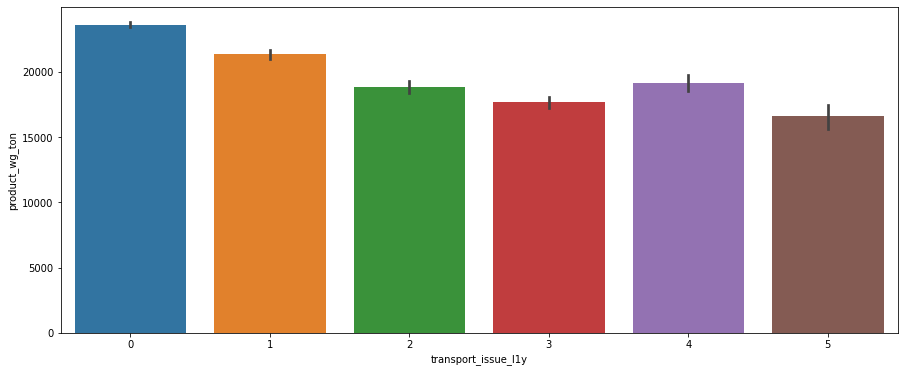

In [8]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df, y='product_wg_ton', x='transport_issue_l1y')
plt.show()

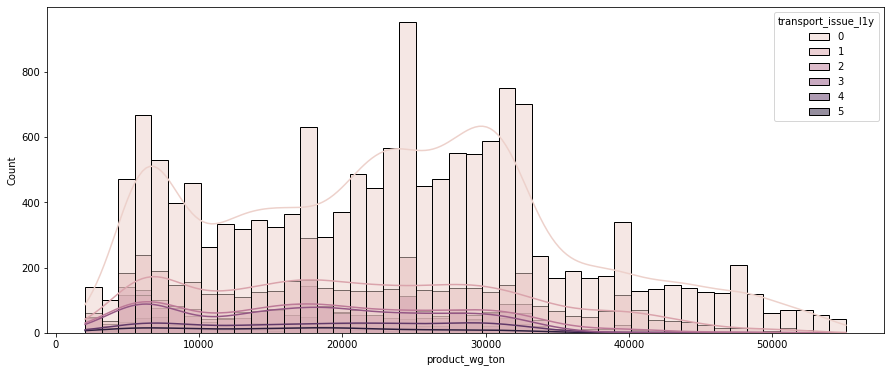

In [9]:
plt.figure(figsize=(15, 6))
sns.histplot(data=df, x='product_wg_ton', hue='transport_issue_l1y', kde=True)
plt.show()

In [13]:
rural = df.query("Location_type == 'Rural'")
urban = df.query("Location_type == 'Urban'")

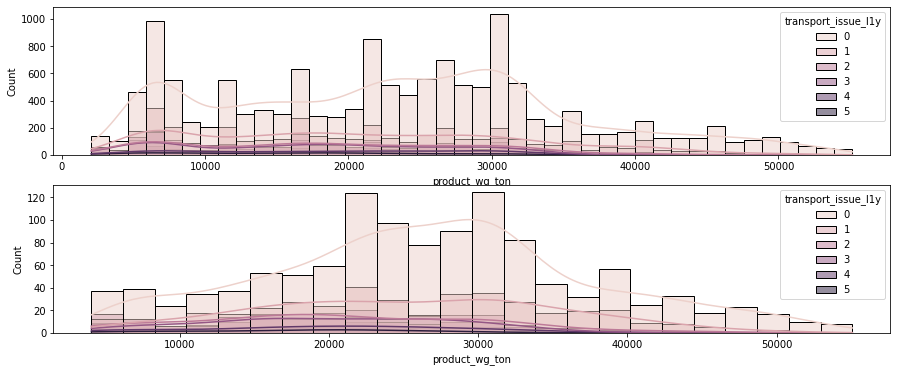

In [15]:
fig, ax = plt.subplots(2, 1, figsize=(15, 6))
sns.histplot(data=rural, x='product_wg_ton', hue='transport_issue_l1y', kde=True, ax=ax[0])
sns.histplot(data=urban, x='product_wg_ton', hue='transport_issue_l1y', kde=True, ax=ax[1])
plt.show()

In [21]:
r_gb = rural.groupby(['Location_type', 'zone', 'WH_regional_zone'])[['product_wg_ton', 'transport_issue_l1y', 'num_refill_req_l3m']].agg(['mean', 'count'])
r_gb

product_wg_ton       transport_issue_l1y  \
                                               mean count                mean   
Location_type zone  WH_regional_zone                                            
Rural         East  Zone 1             19509.108108    37            0.945946   
                    Zone 3             22125.090000   100            0.760000   
                    Zone 4             23214.030303   132            0.856061   
                    Zone 5             23981.428571    70            0.700000   
                    Zone 6             21375.232143    56            0.785714   
              North Zone 1             21950.975827   786            0.807888   
                    Zone 2             22028.320562   783            0.753512   
                    Zone 3             21882.560780   872            0.754587   
                    Zone 4             21716.166045  1072            0.816231   
                    Zone 5             22012.028393  1761            0.816014   
                    Zone 6             21842.173049  4126            0.757635   
              South Zone 1             21391.212934   634            0.787066   
                    Zone 2             22236.262064  1347            0.734967   
                    Zone 3             21103.411548   814            0.813268   
                    Zone 4             21528.919753   810            0.802469   
                    Zone 5             21532.983301  1018            0.706287   
                    Zone 6             22090.404610  1258            0.797297   
              West  Zone 1             21274.880266   451            0.769401   
                    Zone 2             22619.571192   604            0.730132   
                    Zone 3             22310.394799   846            0.776596   
                    Zone 4             21926.595424  1792            0.780134   
                    Zone 5             21307.607743  1369            0.756026   
                    Zone 6             21823.242902  2219            0.741776   

                                           num_refill_req_l3m        
                                     count               mean count  
Location_type zone  WH_regional_zone                                 
Rural         East  Zone 1              37           4.162162    37  
                    Zone 3             100           4.010000   100  
                    Zone 4             132           4.181818   132  
                    Zone 5              70           3.800000    70  
                    Zone 6              56           4.428571    56  
              North Zone 1             786           3.921120   786  
                    Zone 2             783           4.006386   783  
                    Zone 3             872           4.061927   872  
                    Zone 4            1072           4.079291  1072  
                    Zone 5            1761           4.135150  1761  
                    Zone 6            4126           4.068105  4126  
              South Zone 1             634           3.843849   634  
                    Zone 2            1347           4.089829  1347  
                    Zone 3             814           4.137592   814  
                    Zone 4             810           4.100000   810  
                    Zone 5            1018           4.007859  1018  
                    Zone 6            1258           4.060413  1258  
              West  Zone 1             451           4.042129   451  
                    Zone 2             604           4.072848   604  
                    Zone 3             846           4.177305   846  
                    Zone 4            1792           4.128906  1792  
                    Zone 5            1369           4.057706  1369  
                    Zone 6            2219           4.129338  2219

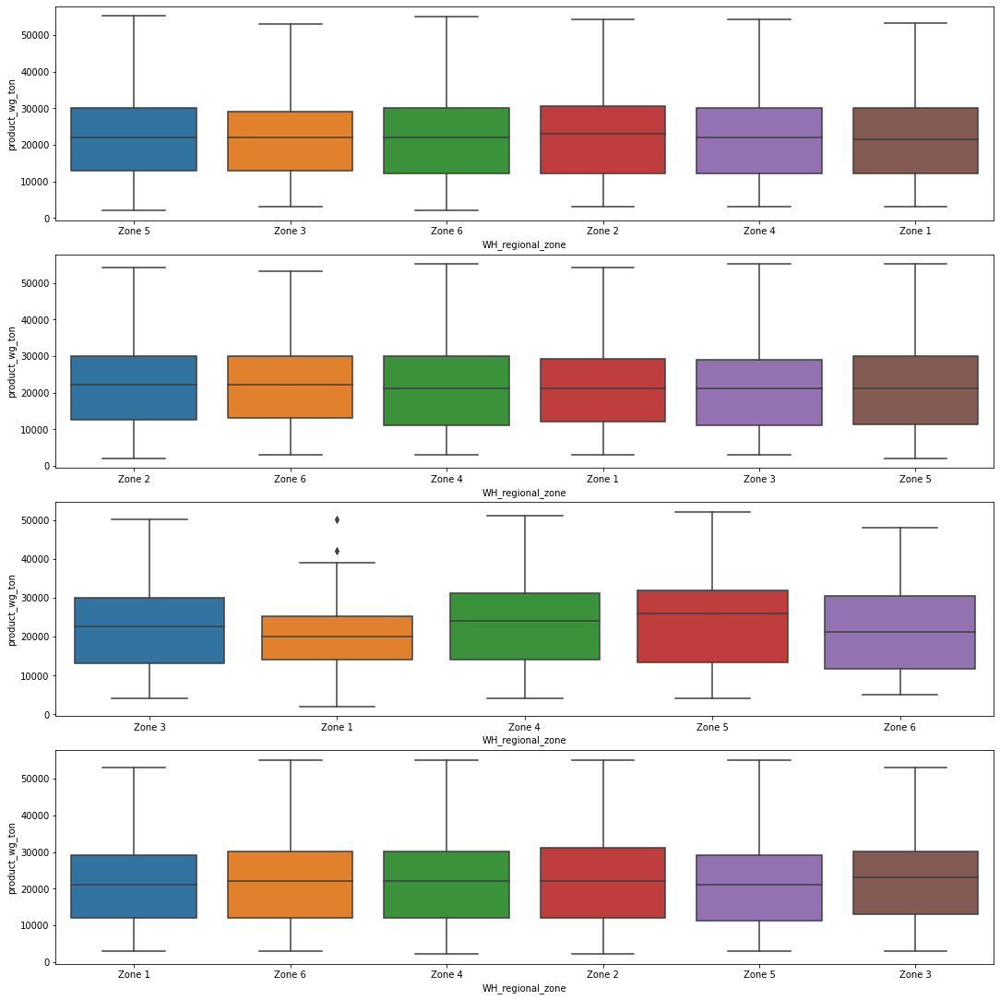

In [38]:
fig, ax = plt.subplots(4, 1, figsize=(15, 15))
sns.boxplot(data=df.query("Location_type == 'Rural' & zone == 'North'"), x='WH_regional_zone', y='product_wg_ton', ax=ax[0])
sns.boxplot(data=df.query("Location_type == 'Rural' & zone == 'South'"), x='WH_regional_zone', y='product_wg_ton', ax=ax[1])
sns.boxplot(data=df.query("Location_type == 'Rural' & zone == 'East'"), x='WH_regional_zone', y='product_wg_ton', ax=ax[2])
sns.boxplot(data=df.query("Location_type == 'Rural' & zone == 'West'"), x='WH_regional_zone', y='product_wg_ton', ax=ax[3])
plt.tight_layout(pad=0.5)
plt.show()

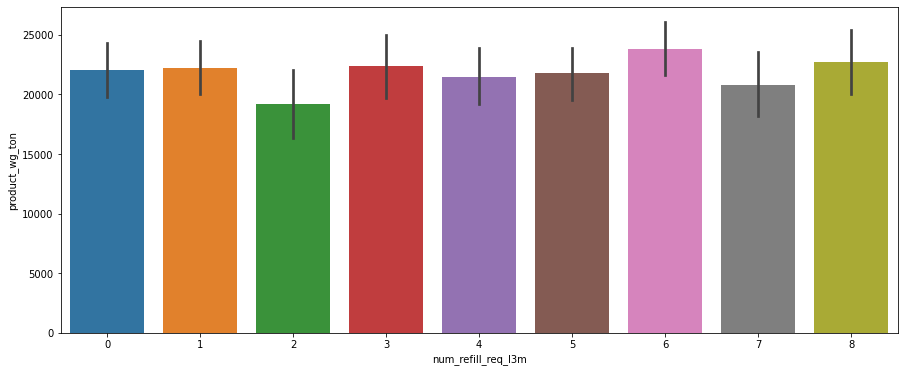

In [46]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df.query("Location_type == 'Rural' & zone == 'North' & WH_regional_zone == 'Zone 1'"),
                x='num_refill_req_l3m', y='product_wg_ton')
plt.show()

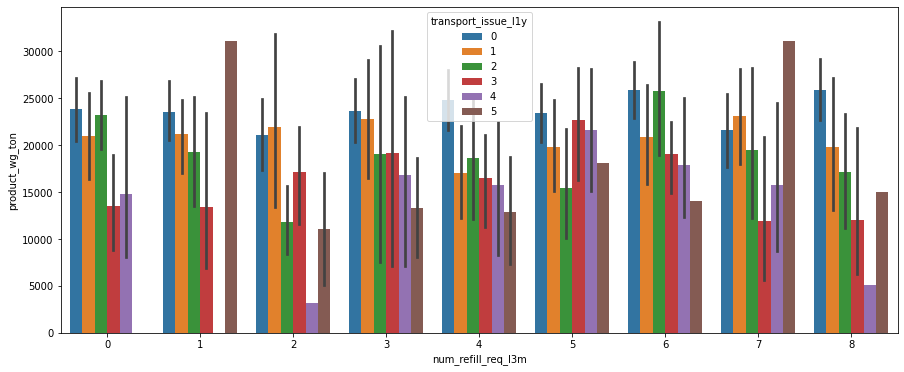

In [56]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df.query("Location_type == 'Rural' & zone == 'North' & WH_regional_zone == 'Zone 1'"),
                x='num_refill_req_l3m', y='product_wg_ton', hue='transport_issue_l1y')
plt.show()

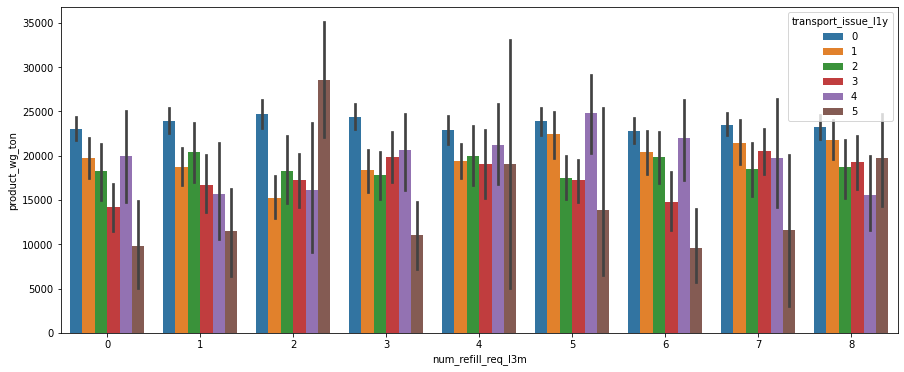

In [57]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df.query("Location_type == 'Rural' & zone == 'North' & WH_regional_zone == 'Zone 6'"),
                x='num_refill_req_l3m', y='product_wg_ton', hue='transport_issue_l1y')
plt.show()

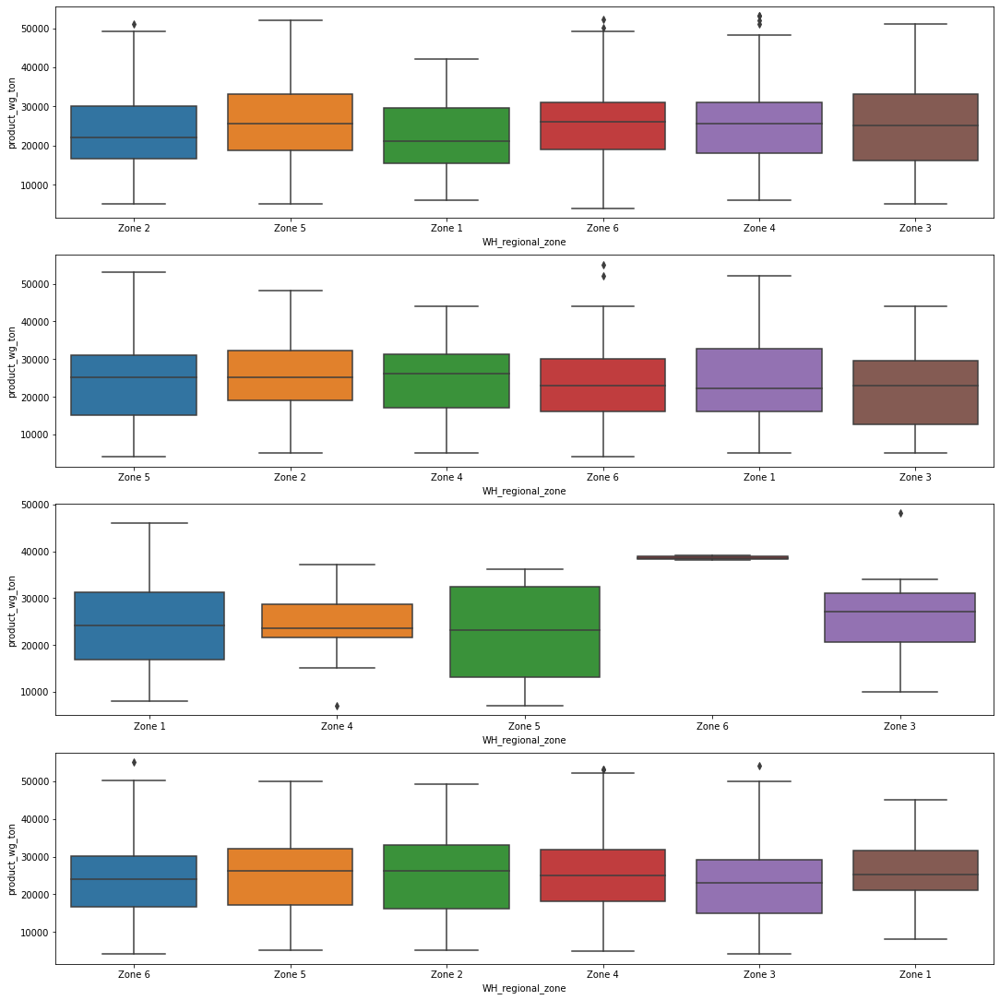

In [42]:
fig, ax = plt.subplots(4, 1, figsize=(15, 15))
sns.boxplot(data=df.query("Location_type == 'Urban' & zone == 'North'"), x='WH_regional_zone', y='product_wg_ton', ax=ax[0])
sns.boxplot(data=df.query("Location_type == 'Urban' & zone == 'South'"), x='WH_regional_zone', y='product_wg_ton', ax=ax[1])
sns.boxplot(data=df.query("Location_type == 'Urban' & zone == 'East'"), x='WH_regional_zone', y='product_wg_ton', ax=ax[2])
sns.boxplot(data=df.query("Location_type == 'Urban' & zone == 'West'"), x='WH_regional_zone', y='product_wg_ton', ax=ax[3])
plt.tight_layout(pad=0.5)
plt.show()

In [161]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Ware_house_ID                 25000 non-null  object 
 1   WH_Manager_ID                 25000 non-null  object 
 2   Location_type                 25000 non-null  object 
 3   WH_capacity_size              25000 non-null  object 
 4   zone                          25000 non-null  object 
 5   WH_regional_zone              25000 non-null  object 
 6   num_refill_req_l3m            25000 non-null  int64  
 7   transport_issue_l1y           25000 non-null  int64  
 8   Competitor_in_mkt             25000 non-null  int64  
 9   retail_shop_num               25000 non-null  int64  
 10  wh_owner_type                 25000 non-null  object 
 11  distributor_num               25000 non-null  int64  
 12  flood_impacted                25000 non-null  int64  
 13  f

In [85]:
df.drop(['Ware_house_ID', 'WH_Manager_ID', 'wh_est_year'], axis=1, inplace=True)

In [86]:
df.dropna(axis=0, inplace=True)

In [87]:
cat_cols = [col for col in df.columns if df[col].dtypes == 'object']
label_encoders = {}

for col in cat_cols:
    le = LabelEncoder()
    le.fit(df[col])
    df[col] = le.transform(df[col])
    label_encoders[col] = le

In [89]:
print(label_encoders)

{'Location_type': LabelEncoder(), 'WH_capacity_size': LabelEncoder(), 'zone': LabelEncoder(), 'WH_regional_zone': LabelEncoder(), 'wh_owner_type': LabelEncoder(), 'approved_wh_govt_certificate': LabelEncoder()}


In [90]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df)

In [91]:
scaled_data

array([[ 3.28040507,  1.63695966,  1.27489446, ...,  0.87892172,
        -0.44333473, -0.49619455],
       [-0.3048404 , -1.05597721, -0.98608975, ..., -0.38899678,
        -0.21163425, -1.55729004],
       [-0.3048404 ,  0.29049122,  0.14440236, ...,  1.51288097,
         0.36761693,  0.03448537],
       ...,
       [-0.3048404 ,  0.29049122,  1.27489446, ...,  0.24496247,
        -0.09578402, -0.93690035],
       [-0.3048404 ,  1.63695966, -0.98608975, ...,  1.51288097,
         1.29441882,  0.20685501],
       [-0.3048404 ,  0.29049122,  1.27489446, ..., -1.02295604,
        -0.90673567, -1.55870002]])

In [92]:
wcss = []
ss = []
dbs = []

for i in range(2, 15):
    km = KMeans(n_clusters=i, random_state=42).fit(scaled_data)
    ss.append(silhouette_score(scaled_data, km.labels_))
    wcss.append(km.inertia_)
    dbs.append(davies_bouldin_score(scaled_data, km.labels_))

In [93]:
kl = KneeLocator(
    range(2, 15), wcss, curve="convex", direction="decreasing"
)

In [94]:
kl.elbow

10

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


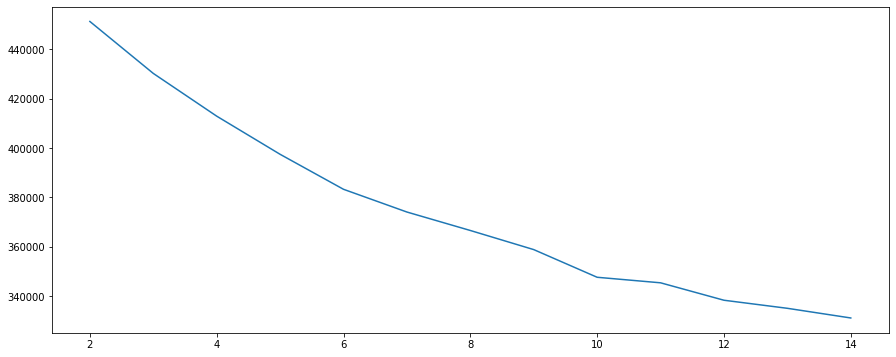

In [95]:
plt.figure(figsize=(15, 6))
sns.lineplot(range(2, 15), wcss)
plt.show()

In [96]:
dbs

[3.5486451583093856,
 3.164129884410448,
 3.0741283956228402,
 2.896228747373051,
 2.7490484216410462,
 2.7683949835599617,
 2.702635726423657,
 2.880059281754411,
 2.6404347094183263,
 2.89145466517322,
 2.4654063128256456,
 2.4257570401762822,
 2.5447420381414836]

In [97]:
wcss[8], ss[8], dbs[8]

(347617.6757270944, 0.0627925459156958, 2.6404347094183263)

In [98]:
km = KMeans(n_clusters=10, random_state=42)
km.fit_predict(scaled_data)

array([3, 2, 0, ..., 2, 0, 3])

In [99]:
cluster_centers = pd.DataFrame(data=km.cluster_centers_, columns=df.columns)

In [100]:
cluster_centers = scaler.inverse_transform(scaled_data)

In [103]:
cluster_centers = pd.DataFrame(data=cluster_centers, columns=df.columns)
cluster_centers

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
0,1.000000e+00,2.0,3.0,5.0,3.0,1.000000e+00,2.0,4651.0,1.0,24.0,0.0,1.0,1.0,91.0,29.0,13.0,0.0,0.0,5.0,15.0,17115.0
1,-1.387779e-17,0.0,1.0,4.0,0.0,1.110223e-16,4.0,6217.0,0.0,47.0,0.0,0.0,1.0,210.0,31.0,4.0,0.0,0.0,3.0,17.0,5074.0
2,-1.387779e-17,1.0,2.0,1.0,1.0,1.110223e-16,4.0,4306.0,0.0,64.0,0.0,0.0,0.0,161.0,37.0,17.0,0.0,0.0,6.0,22.0,23137.0
3,-1.387779e-17,1.0,1.0,2.0,7.0,4.000000e+00,2.0,6000.0,1.0,50.0,0.0,0.0,0.0,103.0,21.0,17.0,1.0,1.0,3.0,27.0,22115.0
4,-1.387779e-17,0.0,1.0,4.0,3.0,1.000000e+00,2.0,4740.0,0.0,42.0,1.0,0.0,1.0,112.0,25.0,18.0,0.0,4.0,6.0,24.0,24071.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23129,-1.387779e-17,1.0,1.0,3.0,7.0,1.110223e-16,3.0,5242.0,1.0,41.0,0.0,0.0,0.0,71.0,25.0,9.0,0.0,2.0,1.0,26.0,11083.0
23130,-1.387779e-17,2.0,1.0,0.0,3.0,1.110223e-16,4.0,5390.0,1.0,19.0,0.0,0.0,1.0,142.0,34.0,22.0,1.0,0.0,2.0,30.0,32093.0
23131,-1.387779e-17,1.0,3.0,1.0,6.0,1.110223e-16,4.0,4490.0,0.0,57.0,0.0,0.0,1.0,130.0,28.0,10.0,0.0,2.0,4.0,18.0,12114.0
23132,-1.387779e-17,2.0,1.0,0.0,1.0,1.110223e-16,2.0,10562.0,1.0,25.0,0.0,0.0,1.0,60.0,25.0,18.0,0.0,0.0,6.0,30.0,25093.0


In [104]:
for col in cat_cols:
    le = label_encoders[col]
    cluster_centers[col] = le.inverse_transform(cluster_centers[col].astype(int))

In [105]:
cluster_centers = pd.DataFrame(data=cluster_centers, columns=df.columns)
cluster_centers

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
0,Urban,Small,West,Zone 6,3.0,1.000000e+00,2.0,4651.0,Rented,24.0,0.0,1.0,1.0,91.0,29.0,13.0,0.0,A,5.0,15.0,17115.0
1,Rural,Large,North,Zone 5,0.0,1.110223e-16,4.0,6217.0,Company Owned,47.0,0.0,0.0,1.0,210.0,31.0,4.0,0.0,A,3.0,17.0,5074.0
2,Rural,Mid,South,Zone 2,1.0,1.110223e-16,4.0,4306.0,Company Owned,64.0,0.0,0.0,0.0,161.0,37.0,17.0,0.0,A,6.0,22.0,23137.0
3,Rural,Mid,North,Zone 3,7.0,4.000000e+00,2.0,6000.0,Rented,50.0,0.0,0.0,0.0,103.0,21.0,17.0,1.0,A+,3.0,27.0,22115.0
4,Rural,Large,North,Zone 5,3.0,1.000000e+00,2.0,4740.0,Company Owned,42.0,1.0,0.0,1.0,112.0,25.0,18.0,0.0,C,6.0,24.0,24071.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23129,Rural,Mid,North,Zone 4,7.0,1.110223e-16,3.0,5242.0,Rented,41.0,0.0,0.0,0.0,71.0,25.0,9.0,0.0,B,1.0,26.0,11083.0
23130,Rural,Small,North,Zone 1,3.0,1.110223e-16,4.0,5390.0,Rented,19.0,0.0,0.0,1.0,142.0,34.0,22.0,1.0,A,2.0,30.0,32093.0
23131,Rural,Mid,West,Zone 2,6.0,1.110223e-16,4.0,4490.0,Company Owned,57.0,0.0,0.0,1.0,130.0,28.0,10.0,0.0,B,4.0,18.0,12114.0
23132,Rural,Small,North,Zone 1,1.0,1.110223e-16,2.0,10562.0,Rented,25.0,0.0,0.0,1.0,60.0,25.0,18.0,0.0,A,6.0,30.0,25093.0


In [106]:
cluster_df = pd.concat([cluster_centers, pd.DataFrame({'Cluster': km.labels_})],axis=1)
cluster_df

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton,Cluster
0,Urban,Small,West,Zone 6,3.0,1.000000e+00,2.0,4651.0,Rented,24.0,0.0,1.0,1.0,91.0,29.0,13.0,0.0,A,5.0,15.0,17115.0,3
1,Rural,Large,North,Zone 5,0.0,1.110223e-16,4.0,6217.0,Company Owned,47.0,0.0,0.0,1.0,210.0,31.0,4.0,0.0,A,3.0,17.0,5074.0,2
2,Rural,Mid,South,Zone 2,1.0,1.110223e-16,4.0,4306.0,Company Owned,64.0,0.0,0.0,0.0,161.0,37.0,17.0,0.0,A,6.0,22.0,23137.0,0
3,Rural,Mid,North,Zone 3,7.0,4.000000e+00,2.0,6000.0,Rented,50.0,0.0,0.0,0.0,103.0,21.0,17.0,1.0,A+,3.0,27.0,22115.0,1
4,Rural,Large,North,Zone 5,3.0,1.000000e+00,2.0,4740.0,Company Owned,42.0,1.0,0.0,1.0,112.0,25.0,18.0,0.0,C,6.0,24.0,24071.0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23129,Rural,Mid,North,Zone 4,7.0,1.110223e-16,3.0,5242.0,Rented,41.0,0.0,0.0,0.0,71.0,25.0,9.0,0.0,B,1.0,26.0,11083.0,8
23130,Rural,Small,North,Zone 1,3.0,1.110223e-16,4.0,5390.0,Rented,19.0,0.0,0.0,1.0,142.0,34.0,22.0,1.0,A,2.0,30.0,32093.0,0
23131,Rural,Mid,West,Zone 2,6.0,1.110223e-16,4.0,4490.0,Company Owned,57.0,0.0,0.0,1.0,130.0,28.0,10.0,0.0,B,4.0,18.0,12114.0,2
23132,Rural,Small,North,Zone 1,1.0,1.110223e-16,2.0,10562.0,Rented,25.0,0.0,0.0,1.0,60.0,25.0,18.0,0.0,A,6.0,30.0,25093.0,0


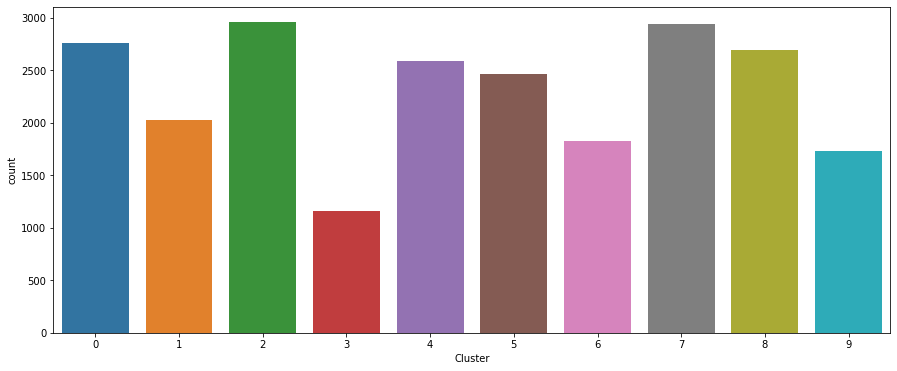

In [33]:
plt.figure(figsize=(15, 6))
sns.countplot(data=cluster_df, x='Cluster')
plt.show()

In [34]:
cluster_df['Cluster'].value_counts()

2    2956
7    2937
0    2762
8    2687
4    2587
5    2465
1    2021
6    1829
9    1732
3    1158
Name: Cluster, dtype: int64

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


<Figure size 1080x1440 with 0 Axes>

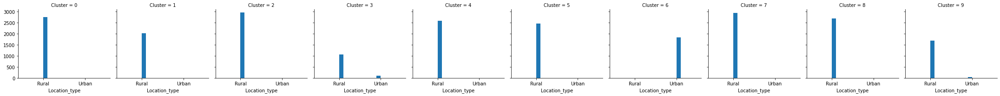

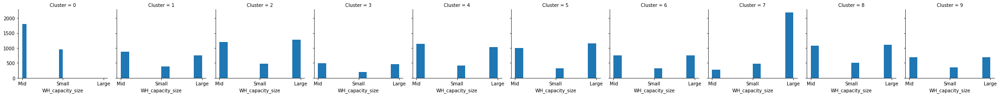

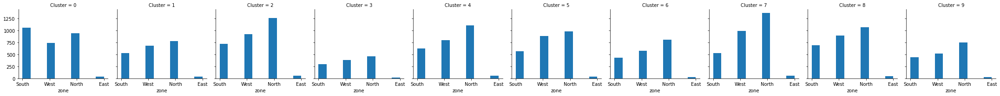

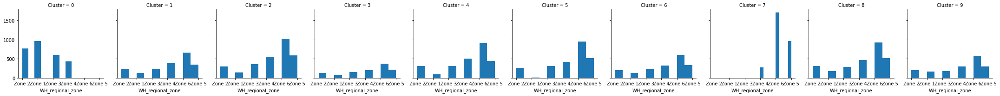

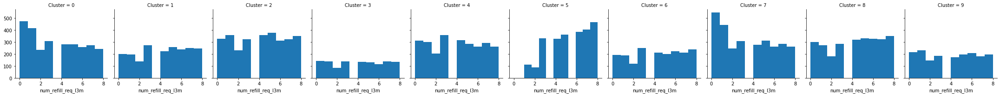

...

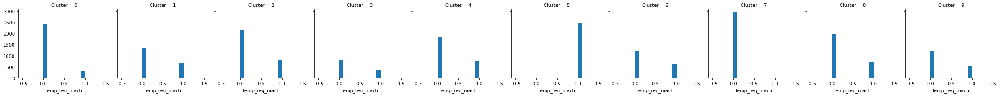

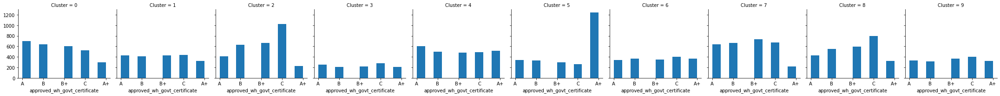

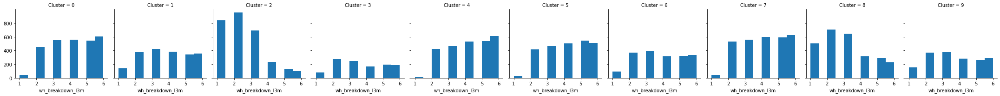

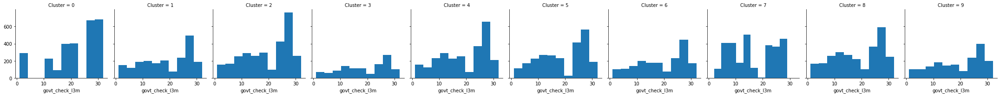

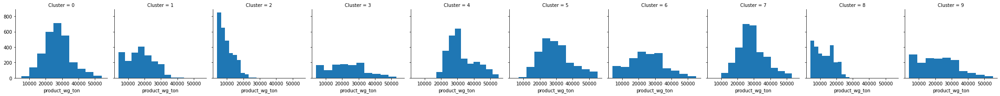

In [79]:
plt.figure(figsize=(15, 20))
for c in cluster_df.drop(['Cluster'],axis=1):
    grid = sns.FacetGrid(cluster_df, col='Cluster')
    grid = grid.map(plt.hist, c)
plt.show()

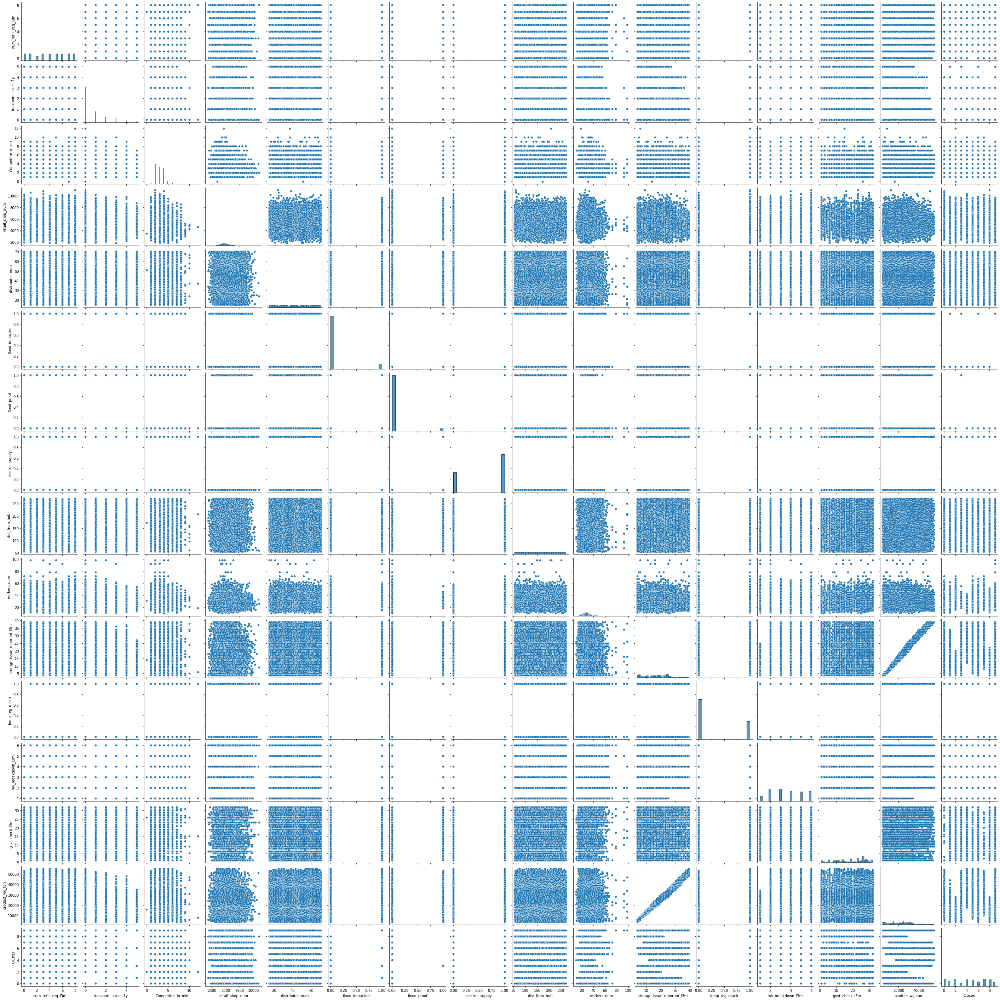

In [116]:
sns.pairplot(data=cluster_df)

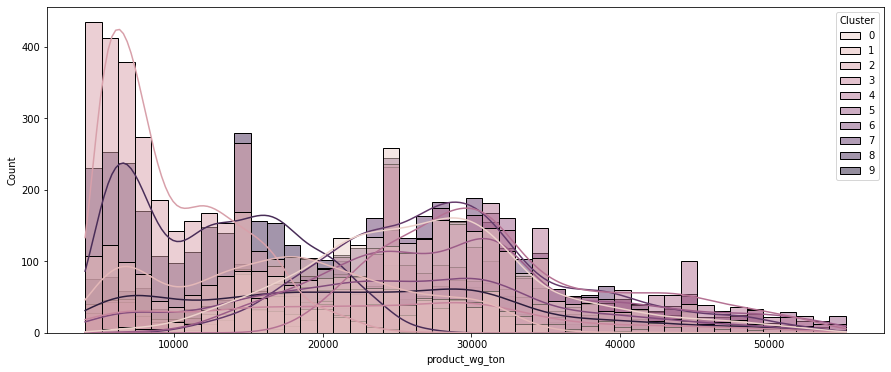

In [37]:
plt.figure(figsize=(15, 6))
sns.histplot(data=cluster_df, x='product_wg_ton', hue='Cluster', kde=True)
plt.show()

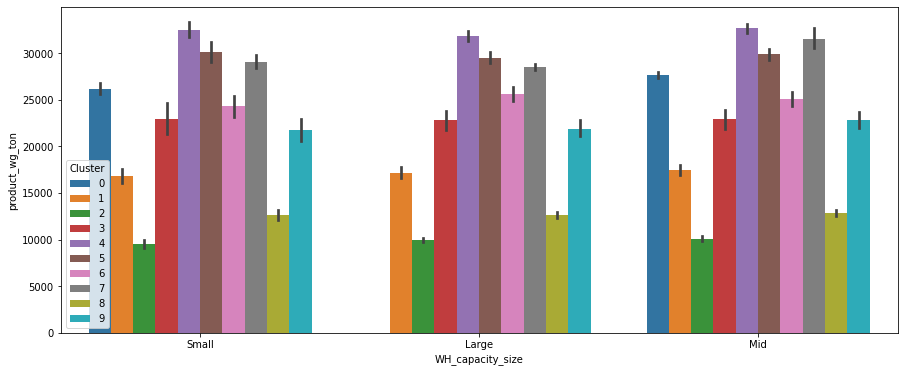

In [38]:
plt.figure(figsize=(15, 6))
sns.barplot(data=cluster_df, x='WH_capacity_size', y='product_wg_ton', hue='Cluster')
plt.show()

In [42]:
cluster_df.groupby('Cluster')['product_wg_ton'].describe()

,count,mean,std,min,25%,50%,75%,max
Cluster,,,,,,,,
0,2762.0,27147.664012,8380.825629,5067.0,21140.75,27084.0,31148.00,54090.0
1,2021.0,17248.759030,7928.128003,4055.0,11086.00,17118.0,23079.00,44132.0
2,2956.0,9942.317321,4391.870794,4060.0,6126.75,8144.0,13101.25,28111.0
3,1158.0,22879.411054,11329.630660,4057.0,14110.25,23061.5,30144.00,53136.0
4,2587.0,32326.709316,8142.295792,17064.0,26130.00,31057.0,37122.00,55115.0
5,2465.0,29738.886410,9548.977408,7062.0,23096.00,29101.0,34120.00,55151.0
6,1829.0,25165.234008,10532.889574,4059.0,17149.00,25085.0,31147.00,55078.0
7,2937.0,28868.055158,8188.028704,10056.0,23096.00,28110.0,33097.00,53141.0
8,2687.0,12734.871232,5616.962538,4058.0,7133.00,12145.0,17106.00,28064.0


In [80]:
cluster_df

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton,Cluster
0,Urban,Small,West,Zone 6,3.0,1.000000e+00,2.0,4651.0,Rented,24.0,0.0,1.0,1.0,91.0,29.0,13.0,0.0,A,5.0,15.0,17115.0,3
1,Rural,Large,North,Zone 5,0.0,1.110223e-16,4.0,6217.0,Company Owned,47.0,0.0,0.0,1.0,210.0,31.0,4.0,0.0,A,3.0,17.0,5074.0,2
2,Rural,Mid,South,Zone 2,1.0,1.110223e-16,4.0,4306.0,Company Owned,64.0,0.0,0.0,0.0,161.0,37.0,17.0,0.0,A,6.0,22.0,23137.0,0
3,Rural,Mid,North,Zone 3,7.0,4.000000e+00,2.0,6000.0,Rented,50.0,0.0,0.0,0.0,103.0,21.0,17.0,1.0,A+,3.0,27.0,22115.0,1
4,Rural,Large,North,Zone 5,3.0,1.000000e+00,2.0,4740.0,Company Owned,42.0,1.0,0.0,1.0,112.0,25.0,18.0,0.0,C,6.0,24.0,24071.0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23129,Rural,Mid,North,Zone 4,7.0,1.110223e-16,3.0,5242.0,Rented,41.0,0.0,0.0,0.0,71.0,25.0,9.0,0.0,B,1.0,26.0,11083.0,8
23130,Rural,Small,North,Zone 1,3.0,1.110223e-16,4.0,5390.0,Rented,19.0,0.0,0.0,1.0,142.0,34.0,22.0,1.0,A,2.0,30.0,32093.0,0
23131,Rural,Mid,West,Zone 2,6.0,1.110223e-16,4.0,4490.0,Company Owned,57.0,0.0,0.0,1.0,130.0,28.0,10.0,0.0,B,4.0,18.0,12114.0,2
23132,Rural,Small,North,Zone 1,1.0,1.110223e-16,2.0,10562.0,Rented,25.0,0.0,0.0,1.0,60.0,25.0,18.0,0.0,A,6.0,30.0,25093.0,0


In [57]:
rural_cluster_gb = cluster_df.query("Location_type == 'Rural'").groupby(['zone', 'WH_regional_zone', 'Cluster'])['num_refill_req_l3m'].agg(['mean', 'count']).reset_index()
urban_cluster_gb = cluster_df.query("Location_type == 'Urban'").groupby(['zone', 'WH_regional_zone', 'Cluster'])['num_refill_req_l3m'].agg(['mean', 'count']).reset_index()

In [68]:
concat_df = pd.concat([rural_cluster_gb, urban_cluster_gb])
concat_df

,zone,WH_regional_zone,Cluster,mean,count
0,East,Zone 1,0,3.857143,14
1,East,Zone 1,1,4.750000,4
2,East,Zone 1,2,3.333333,3
3,East,Zone 1,3,4.000000,3
4,East,Zone 1,4,3.000000,1
...,...,...,...,...,...
57,West,Zone 5,6,4.198113,106
58,West,Zone 6,1,0.000000,1
59,West,Zone 6,3,4.818182,11
60,West,Zone 6,6,4.232258,155


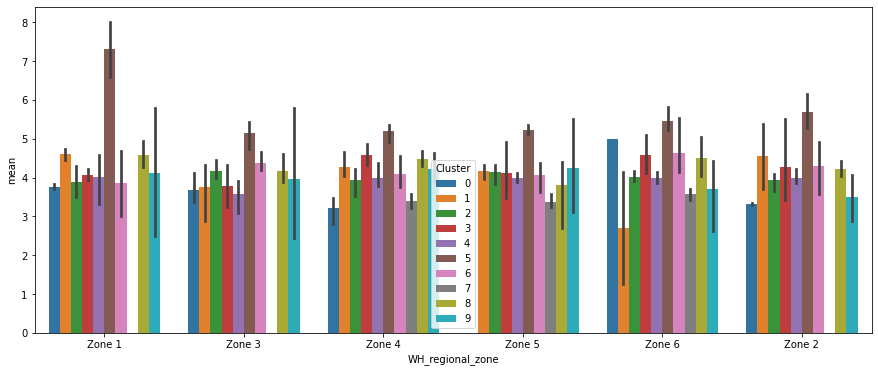

In [71]:
plt.figure(figsize=(15, 6))
sns.barplot(data=concat_df, x='WH_regional_zone', y='mean', hue='Cluster')
plt.show()

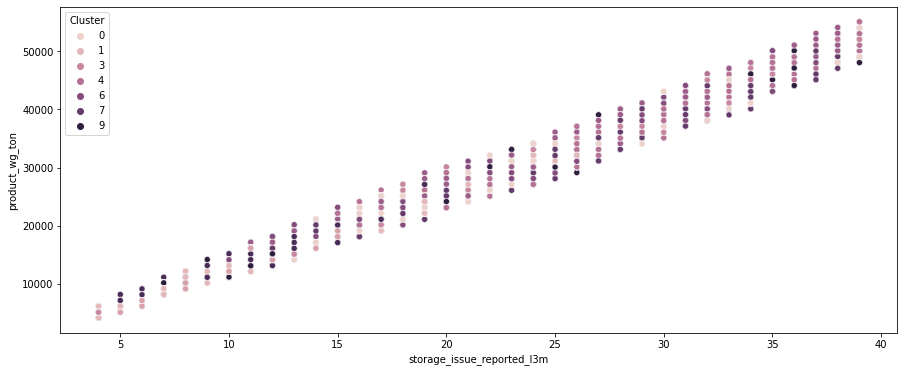

In [78]:
plt.figure(figsize=(15, 6))
sns.scatterplot(data=cluster_df, x='storage_issue_reported_l3m', y='product_wg_ton', hue='Cluster')
plt.show()

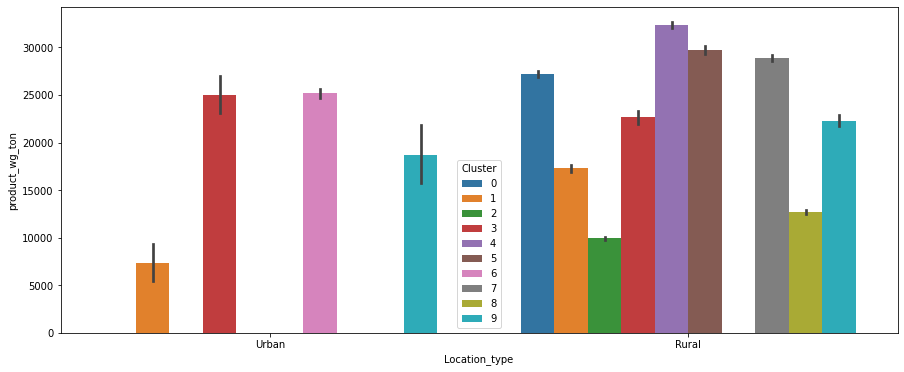

In [122]:
plt.figure(figsize=(15, 6))
sns.barplot(data=cluster_df, x='Location_type', y='product_wg_ton', hue='Cluster')
plt.show()

In [131]:
df_copy = cluster_df.copy()
df_copy.rename(columns={'Cluster': 'Cluster_7'}, inplace=True)

In [132]:
df_copy

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton,Cluster_7
0,Urban,Small,West,Zone 6,3.0,1.000000e+00,2.0,4651.0,Rented,24.0,0.0,1.0,1.0,91.0,29.0,13.0,0.0,A,5.0,15.0,17115.0,3
1,Rural,Large,North,Zone 5,0.0,1.110223e-16,4.0,6217.0,Company Owned,47.0,0.0,0.0,1.0,210.0,31.0,4.0,0.0,A,3.0,17.0,5074.0,2
2,Rural,Mid,South,Zone 2,1.0,1.110223e-16,4.0,4306.0,Company Owned,64.0,0.0,0.0,0.0,161.0,37.0,17.0,0.0,A,6.0,22.0,23137.0,0
3,Rural,Mid,North,Zone 3,7.0,4.000000e+00,2.0,6000.0,Rented,50.0,0.0,0.0,0.0,103.0,21.0,17.0,1.0,A+,3.0,27.0,22115.0,1
4,Rural,Large,North,Zone 5,3.0,1.000000e+00,2.0,4740.0,Company Owned,42.0,1.0,0.0,1.0,112.0,25.0,18.0,0.0,C,6.0,24.0,24071.0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23129,Rural,Mid,North,Zone 4,7.0,1.110223e-16,3.0,5242.0,Rented,41.0,0.0,0.0,0.0,71.0,25.0,9.0,0.0,B,1.0,26.0,11083.0,8
23130,Rural,Small,North,Zone 1,3.0,1.110223e-16,4.0,5390.0,Rented,19.0,0.0,0.0,1.0,142.0,34.0,22.0,1.0,A,2.0,30.0,32093.0,0
23131,Rural,Mid,West,Zone 2,6.0,1.110223e-16,4.0,4490.0,Company Owned,57.0,0.0,0.0,1.0,130.0,28.0,10.0,0.0,B,4.0,18.0,12114.0,2
23132,Rural,Small,North,Zone 1,1.0,1.110223e-16,2.0,10562.0,Rented,25.0,0.0,0.0,1.0,60.0,25.0,18.0,0.0,A,6.0,30.0,25093.0,0


In [133]:
cat_cols = [col for col in df_copy.columns if df_copy[col].dtypes == 'object']
label_encoders = {}

for col in cat_cols:
    le = LabelEncoder()
    le.fit(df_copy[col])
    df_copy[col] = le.transform(df_copy[col])
    label_encoders[col] = le

In [134]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_copy)

In [142]:
for i in range(1, 11):
    km = KMeans(n_clusters=i, random_state=42)
    km.fit(scaled_data)
    df_copy[f'KMeans_{i}'] = km.labels_

In [156]:
#df_copy.drop('Cluster_7', axis=1, inplace=True)

In [144]:
df_copy

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,...,govt_check_l3m,product_wg_ton,KMeans_1,KMeans_2,KMeans_3,KMeans_4,KMeans_5,KMeans_6,KMeans_7,KMeans_8,KMeans_9,KMeans_10
0,1,2,3,5,3.0,1.000000e+00,2.0,4651.0,1,24.0,0.0,1.0,...,15.0,17115.0,0,1,1,1,4,0,4,6,7,8
1,0,0,1,4,0.0,1.110223e-16,4.0,6217.0,0,47.0,0.0,0.0,...,17.0,5074.0,0,1,1,1,3,5,3,3,8,6
2,0,1,2,1,1.0,1.110223e-16,4.0,4306.0,0,64.0,0.0,0.0,...,22.0,23137.0,0,0,0,1,3,3,2,1,3,0
3,0,1,1,2,7.0,4.000000e+00,2.0,6000.0,1,50.0,0.0,0.0,...,27.0,22115.0,0,1,1,0,3,1,6,7,2,2
4,0,0,1,4,3.0,1.000000e+00,2.0,4740.0,0,42.0,1.0,0.0,...,24.0,24071.0,0,0,2,3,1,4,5,2,0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23129,0,1,1,3,7.0,1.110223e-16,3.0,5242.0,1,41.0,0.0,0.0,...,26.0,11083.0,0,1,1,0,1,1,0,5,1,1
23130,0,2,1,0,3.0,1.110223e-16,4.0,5390.0,1,19.0,0.0,0.0,...,30.0,32093.0,0,0,0,1,3,3,2,1,3,0
23131,0,1,3,1,6.0,1.110223e-16,4.0,4490.0,0,57.0,0.0,0.0,...,18.0,12114.0,0,1,1,1,3,5,2,3,8,6
23132,0,2,1,0,1.0,1.110223e-16,2.0,10562.0,1,25.0,0.0,0.0,...,30.0,25093.0,0,0,0,1,3,3,2,1,3,0


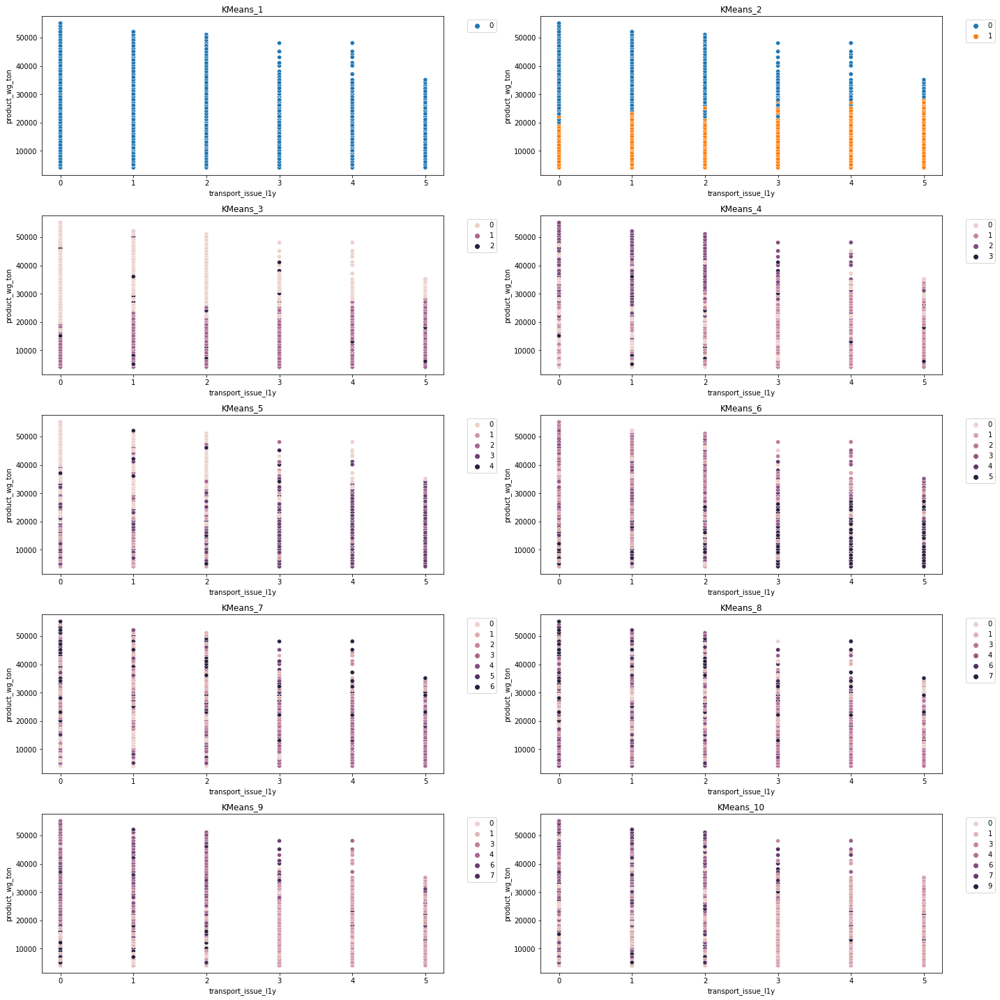

In [155]:
fig, axes = plt.subplots(5, 2, figsize=(20, 20))

for i, ax in enumerate(fig.axes, start=1):
    sns.scatterplot(x=df_copy['transport_issue_l1y'], y=df_copy['product_wg_ton'], hue=df_copy[f'KMeans_{i}'], ax=ax)
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout(pad=1)
    ax.set_title(f'KMeans_{i}')

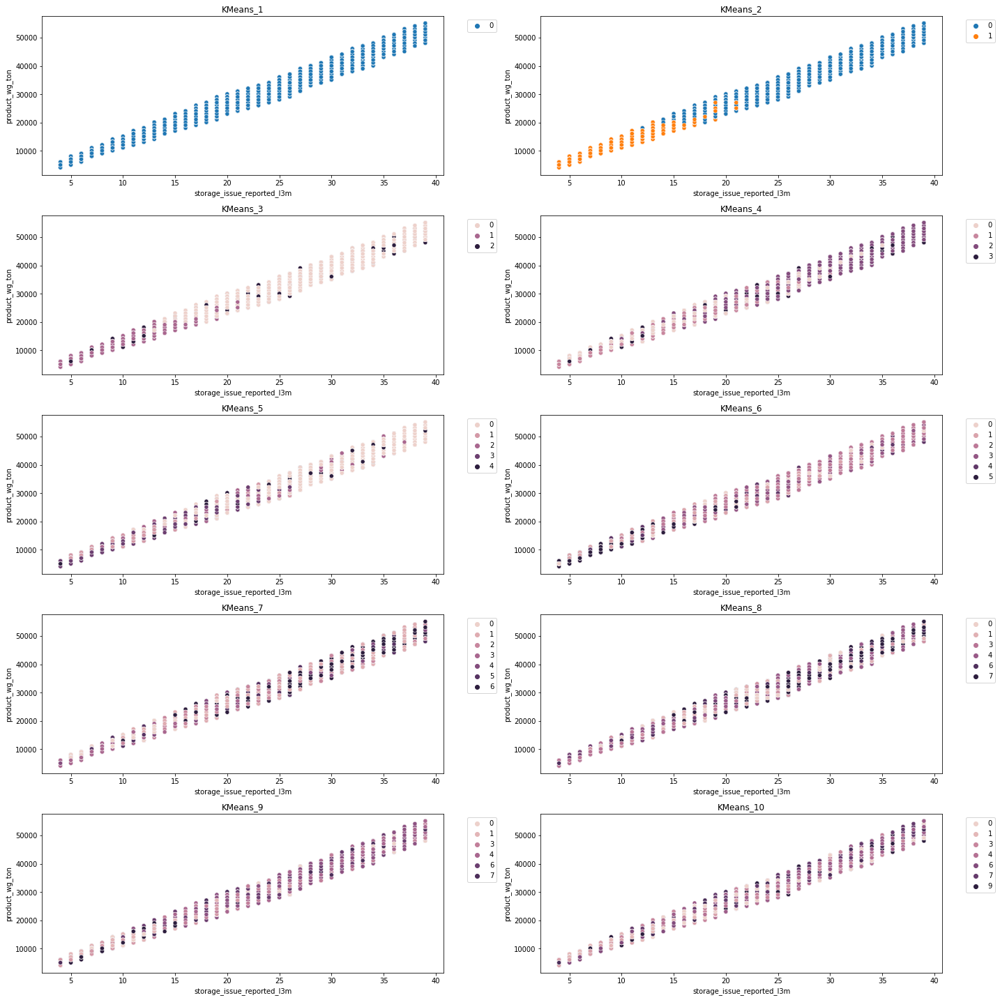

In [154]:
fig, axes = plt.subplots(5, 2, figsize=(20, 20))

for i, ax in enumerate(fig.axes, start=1):
    sns.scatterplot(x=df_copy['storage_issue_reported_l3m'], y=df_copy['product_wg_ton'], hue=df_copy[f'KMeans_{i}'], ax=ax)
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout(pad=1)
    ax.set_title(f'KMeans_{i}')

In [13]:
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, davies_bouldin_score

In [102]:
gmm = GaussianMixture(n_components=3, random_state=42)
gmm_labels = gmm.fit_predict(X)
gmm_score = silhouette_score(X, gmm_labels)
gmm_db_score = davies_bouldin_score(X, gmm_labels)

print(f"Gaussian Mixture Clustering Silhouette Score: {gmm_score:.2f}")
print(f"Gaussian Mixture Clustering Davies-Bouldin Index: {gmm_db_score:.2f}")

Gaussian Mixture Clustering Silhouette Score: 0.14
Gaussian Mixture Clustering Davies-Bouldin Index: 2.37


In [104]:
hclust = AgglomerativeClustering(n_clusters=3, linkage='ward')
hclust_labels = hclust.fit_predict(X)
hclust_score = silhouette_score(X, hclust_labels)
hclust_db_score = davies_bouldin_score(X, hclust_labels)

print(f"Hierarchical Clustering Silhouette Score: {hclust_score:.2f}")
print(f"Hierarchical Clustering Davies-Bouldin Index: {hclust_db_score:.2f}")

Hierarchical Clustering Silhouette Score: 0.12
Hierarchical Clustering Davies-Bouldin Index: 2.86


In [105]:
aggclust = AgglomerativeClustering(n_clusters=3, linkage='complete')
aggclust_labels = aggclust.fit_predict(X)
aggclust_score = silhouette_score(X, aggclust_labels)
aggclust_db_score = davies_bouldin_score(X, aggclust_labels)

print(f"Agglomerative Clustering Silhouette Score: {aggclust_score:.2f}")
print(f"Agglomerative Clustering Davies-Bouldin Index: {aggclust_db_score:.2f}")

Agglomerative Clustering Silhouette Score: 0.01
Agglomerative Clustering Davies-Bouldin Index: 4.74


In [151]:
def GMM_Clust(model):
    ss = []
    dbs = []

    for i in range(2, 15):
        clust = model(n_components=i, random_state=42)
        clust_labels = clust.fit_predict(X)
        ss.append(silhouette_score(X, clust_labels))
        dbs.append(davies_bouldin_score(X, clust_labels))
        
    return (ss, dbs)

In [152]:
gmmclust = GaussianMixture
ss, dbs = GMM_Clust(gmmclust)

In [155]:
clust = GaussianMixture(n_components=4, random_state=42)
clust_labels = clust.fit_predict(X)

In [ ]:
cluster_centers = pd.DataFrame(data=kmeans_model.cluster_centers_, columns=[df.columns])
cluster_centers = scalar.inverse_transform(cluster_centers)
cluster_centers = pd.DataFrame(data=cluster_centers, columns=[df.columns])
cluster_centers

In [153]:
ss, dbs

([0.1393179760433463,
  0.13510327339873274,
  0.12780201942753533,
  0.11600971549946182,
  0.07033579999106752,
  0.0649573680900967,
  0.0600626981435289,
  0.04730458217139754,
  0.05075685466580009,
  0.050295648134248715,
  0.044045277420023066,
  0.041217247809542584,
  0.04446719776724435],
 [3.3628486459623694,
  2.3657086640774705,
  2.3451632886505656,
  3.389354715003401,
  4.766364441184785,
  3.849709600115219,
  3.7762233416904305,
  4.021394996313702,
  3.9979217837167327,
  3.7817222700754654,
  4.062326585714655,
  4.023528212561228,
  3.320446879996252])

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


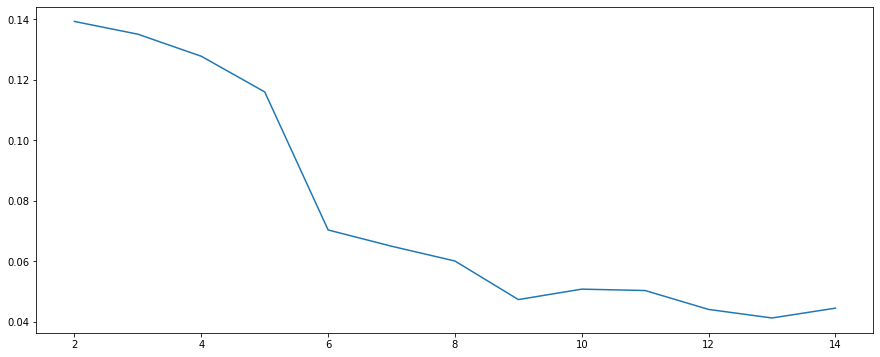

In [126]:
plt.figure(figsize=(15, 6))
sns.lineplot(range(2, 15),ss)
plt.show()

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


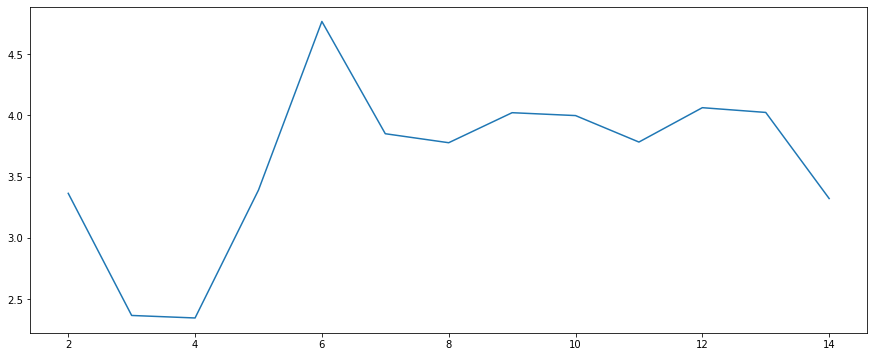

In [128]:
plt.figure(figsize=(15, 6))
sns.lineplot(range(2, 15),dbs)
plt.show()

In [134]:
def AGG_Clust(model, linkage=None):
    ss = []
    dbs = []

    for i in range(2, 15):
        clust = model(n_clusters=i, linkage=linkage)
        clust_labels = clust.fit_predict(X)
        ss.append(silhouette_score(X, clust_labels))
        dbs.append(davies_bouldin_score(X, clust_labels))
        
    return (ss, dbs)

In [135]:
aggclust = AgglomerativeClustering
ss, dbs = AGG_Clust(aggclust, 'ward')

In [136]:
ss, dbs

([0.14439709725558544,
  0.11524476565712537,
  0.126481322376374,
  0.06501968588943297,
  0.056781299048280144,
  0.04197839156403074,
  0.04485916402314737,
  0.038032632668606306,
  0.03656445122138322,
  0.03138012817445491,
  0.02736866025436151,
  0.024918819908491006,
  0.022046393581689572],
 [3.081018148800072,
  2.8608606238376884,
  2.3405952117828503,
  3.15787097139035,
  2.8851796333822186,
  3.3005131630952946,
  3.19184299213111,
  3.070333653153936,
  3.084959186492112,
  3.1681174785253954,
  3.2483246456034878,
  3.1782911476148152,
  3.1289210084089554])

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


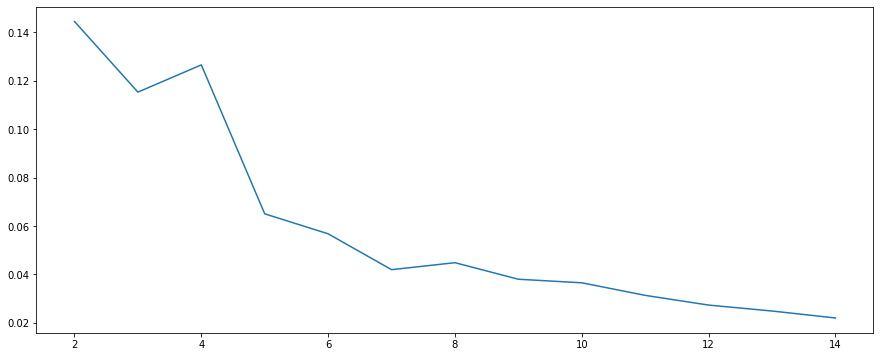

In [137]:
plt.figure(figsize=(15, 6))
sns.lineplot(range(2, 15),ss)
plt.show()

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


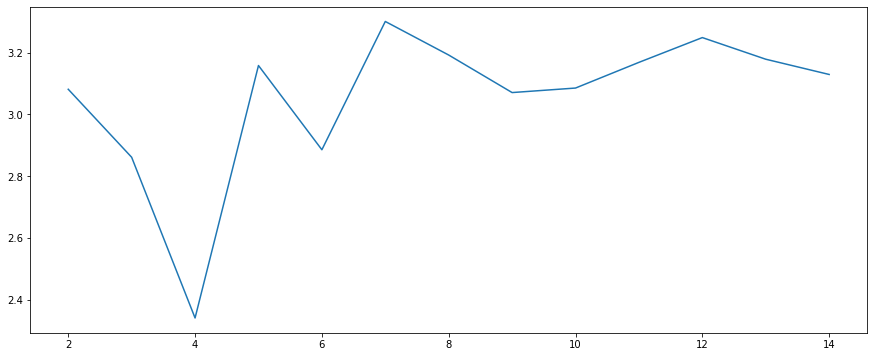

In [138]:
plt.figure(figsize=(15, 6))
sns.lineplot(range(2, 15),dbs)
plt.show()

In [139]:
aggclust = AgglomerativeClustering
ss, dbs = AGG_Clust(aggclust, 'complete')

In [140]:
ss, dbs

([0.37456662920195294,
  0.014598464593518469,
  0.026347599882363272,
  0.02427505440220452,
  0.024968932981911603,
  0.02299370748031831,
  0.01833001743294354,
  0.023552327751718127,
  0.023040908579695485,
  0.021182873744396195,
  0.019919779256408015,
  0.026579231786738673,
  0.02114651022211486],
 [1.0653206891080582,
  4.737601213225612,
  3.997303126557602,
  3.640258945540878,
  3.6085119419027527,
  3.4619365121021604,
  3.416221078090274,
  3.2924883640137557,
  3.268065606477696,
  3.1441285275216555,
  3.2955057485668404,
  3.182413562418202,
  3.304473707191856])

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


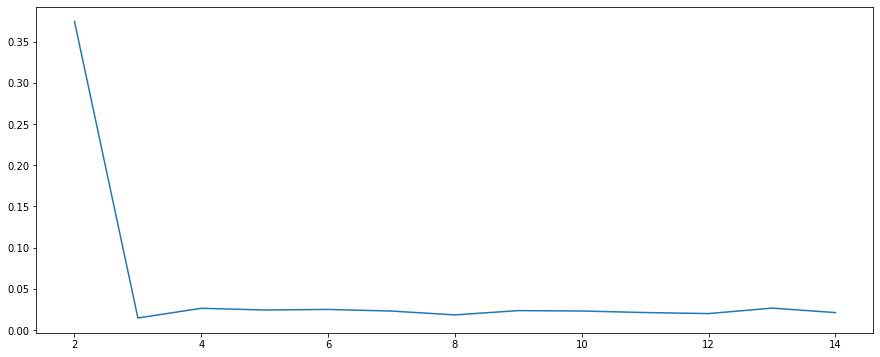

In [141]:
plt.figure(figsize=(15, 6))
sns.lineplot(range(2, 15),ss)
plt.show()

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


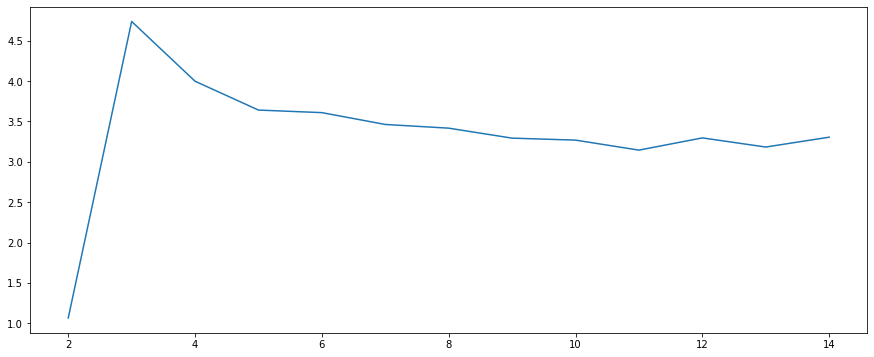

In [142]:
plt.figure(figsize=(15, 6))
sns.lineplot(range(2, 15),dbs)
plt.show()

In [29]:
df.dropna(axis=0, inplace=True)

In [30]:
df.drop(['Ware_house_ID', 'WH_Manager_ID'], axis=1, inplace=True)

In [31]:
cat_cols = [col for col in cluster_df.columns if cluster_df[col].dtypes == 'object']
for col in cat_cols:
    le = LabelEncoder()
    cluster_df.loc[:, col] = le.fit_transform(cluster_df[col])

In [26]:
X = cluster_df.drop('product_wg_ton', axis=1)
y = cluster_df['product_wg_ton']

In [27]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)

In [32]:
model = IsolationForest(contamination=0.01)

In [33]:
model.fit(cluster_df)

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


IsolationForest(contamination=0.01)

In [34]:
cluster_df['IF_anomaly_score'] = model.decision_function(cluster_df)
cluster_df['IF_anomaly'] = model.fit_predict(cluster_df)

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


In [66]:
from sklearn import model_selection
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import cross_val_score
import numpy as np

X = df.drop('product_wg_ton', axis=1)
y = df['product_wg_ton']
isolation_forest = IsolationForest()
param_grid = {
    "contamination": [0.1, 0.2, 0.3, 0.4, 0.5, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07]
}
model = model_selection.GridSearchCV(
    estimator=isolation_forest,
    param_grid=param_grid,
    scoring="neg_mean_squared_error",
    verbose=10,
    n_jobs=1,
    cv=10
)
model.fit(X.values, y.values)
print(f"Best score: {model.best_score_}")
print("Best parameters set:")
best_parameters = model.best_estimator_.get_params()
for param_name in sorted(param_grid.keys()):
    print(f"\t{param_name}: {best_parameters[param_name]}")

Fitting 10 folds for each of 12 candidates, totalling 120 fits
[CV 1/10; 1/12] START contamination=0.1.........................................
[CV 1/10; 1/12] END .contamination=0.1;, score=-722396451.394 total time=   0.5s
[CV 2/10; 1/12] START contamination=0.1.........................................
[CV 2/10; 1/12] END .contamination=0.1;, score=-757474307.527 total time=   0.4s
[CV 3/10; 1/12] START contamination=0.1.........................................
[CV 3/10; 1/12] END .contamination=0.1;, score=-764162810.017 total time=   0.4s
[CV 4/10; 1/12] START contamination=0.1.........................................
[CV 4/10; 1/12] END .contamination=0.1;, score=-733336406.255 total time=   0.5s
[CV 5/10; 1/12] START contamination=0.1.........................................
[CV 5/10; 1/12] END .contamination=0.1;, score=-730436739.801 total time=   0.5s
[CV 6/10; 1/12] START contamination=0.1.........................................
[CV 6/10; 1/12] END .contamination=0.1;, score

[CV 1/10; 6/12] END contamination=0.01;, score=-722388306.059 total time=   0.4s
[CV 2/10; 6/12] START contamination=0.01........................................
[CV 2/10; 6/12] END contamination=0.01;, score=-757467458.073 total time=   0.5s
[CV 3/10; 6/12] START contamination=0.01........................................
[CV 3/10; 6/12] END contamination=0.01;, score=-764154083.297 total time=   0.5s
[CV 4/10; 6/12] START contamination=0.01........................................
[CV 4/10; 6/12] END contamination=0.01;, score=-733328774.321 total time=   0.5s
[CV 5/10; 6/12] START contamination=0.01........................................
[CV 5/10; 6/12] END contamination=0.01;, score=-730428672.629 total time=   0.4s
[CV 6/10; 6/12] START contamination=0.01........................................
[CV 6/10; 6/12] END contamination=0.01;, score=-755191347.508 total time=   0.5s
[CV 7/10; 6/12] START contamination=0.01........................................
[CV 7/10; 6/12] END contamin

[CV 2/10; 11/12] END contamination=0.06;, score=-757471734.106 total time=   0.5s
[CV 3/10; 11/12] START contamination=0.06.......................................
[CV 3/10; 11/12] END contamination=0.06;, score=-764159356.942 total time=   0.4s
[CV 4/10; 11/12] START contamination=0.06.......................................
[CV 4/10; 11/12] END contamination=0.06;, score=-733333000.880 total time=   0.5s
[CV 5/10; 11/12] START contamination=0.06.......................................
[CV 5/10; 11/12] END contamination=0.06;, score=-730432681.915 total time=   0.5s
[CV 6/10; 11/12] START contamination=0.06.......................................
[CV 6/10; 11/12] END contamination=0.06;, score=-755196279.396 total time=   0.5s
[CV 7/10; 11/12] START contamination=0.06.......................................
[CV 7/10; 11/12] END contamination=0.06;, score=-709864514.443 total time=   0.4s
[CV 8/10; 11/12] START contamination=0.06.......................................
[CV 8/10; 11/12] END c

In [44]:
cluster_df[cluster_df['IF_anomaly'] == -1]

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,...,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton,Cluster,IF_anomaly,IF_anomaly_score
45,1,1,2,1,8.0,0.0,2.0,5245.0,1,18.0,...,2011.0,18.0,1.0,3,1.0,32.0,24113.0,4,-1,-0.035453
148,0,0,1,5,6.0,2.0,2.0,5014.0,0,59.0,...,2002.0,23.0,0.0,4,4.0,23.0,31134.0,4,-1,-0.021180
193,1,1,1,1,3.0,4.0,2.0,5023.0,1,53.0,...,2001.0,27.0,1.0,4,6.0,1.0,35135.0,0,-1,-0.030091
341,0,2,3,5,8.0,0.0,5.0,3608.0,0,34.0,...,2007.0,18.0,1.0,1,6.0,9.0,23089.0,4,-1,-0.034863
455,1,2,3,0,4.0,0.0,7.0,5505.0,1,56.0,...,2006.0,22.0,1.0,0,5.0,3.0,31133.0,0,-1,-0.018464
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11633,0,0,1,4,5.0,2.0,4.0,3579.0,1,46.0,...,2002.0,34.0,1.0,3,5.0,17.0,41061.0,4,-1,-0.012241
11684,1,1,2,1,3.0,0.0,6.0,3629.0,1,15.0,...,2001.0,29.0,1.0,1,2.0,32.0,38109.0,0,-1,-0.009855
11712,1,2,2,0,5.0,1.0,1.0,5668.0,1,31.0,...,2002.0,26.0,0.0,4,2.0,21.0,33078.0,2,-1,-0.017659
12075,1,2,3,5,7.0,3.0,4.0,9869.0,0,47.0,...,2018.0,6.0,0.0,4,1.0,15.0,7102.0,0,-1,-0.029550


In [104]:
pd.set_option('display.max_columns', 25)
cluster_df.head()

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton,Cluster,IF_anomaly,IF_anomaly_score
0,0,0,1,4,3.0,1.0,2.0,4740.0,0,42.0,1.0,0.0,1.0,112.0,25.0,2009.0,18.0,0.0,4,6.0,24.0,24071.0,2,1,0.082300
1,0,2,3,0,8.0,0.0,2.0,5053.0,1,37.0,0.0,0.0,1.0,152.0,35.0,2009.0,23.0,1.0,1,3.0,3.0,32134.0,5,1,0.089037
2,0,0,3,5,8.0,0.0,4.0,4449.0,0,38.0,0.0,0.0,1.0,77.0,27.0,2010.0,24.0,0.0,2,3.0,6.0,30142.0,3,1,0.135385
3,0,2,2,5,8.0,1.0,4.0,5381.0,1,42.0,0.0,0.0,1.0,124.0,22.0,2013.0,13.0,1.0,1,5.0,2.0,18082.0,3,1,0.089658
4,0,0,1,5,7.0,1.0,3.0,4623.0,0,31.0,0.0,0.0,1.0,150.0,37.0,1999.0,17.0,0.0,3,4.0,6.0,21125.0,6,1,0.131087


In [84]:
def outlier_plot(data, outlier_method_name, x_var, y_var, plot='S'):
    print(f"Outlier Method Name: {outlier_method_name}")
    
    method = f'{outlier_method_name}_anomaly'
    print(f"Number of anomalous value: {len(data[data['IF_anomaly'] == -1])}")
    print(f"Number of non anomalous value: {len(data[data['IF_anomaly'] == 1])}")
    print(f"Total Number of values: {len(data)}")
    
    if plot == 'S':
        g = sns.FacetGrid(data, col='IF_anomaly', height=4, hue='IF_anomaly', hue_order=[1, -1])
        g.map(sns.scatterplot, x_var, y_var)
    elif plot == 'B':
        g = sns.FacetGrid(data, col='IF_anomaly', hue='IF_anomaly')
        g.map(sns.barplot, x_var, y_var, order=np.unique(df[x_var]))
    else:
        None
    return g

Outlier Method Name: Isolation Forest
Number of anomalous value: 122
Number of non anomalous value: 12005
Total Number of values: 12127


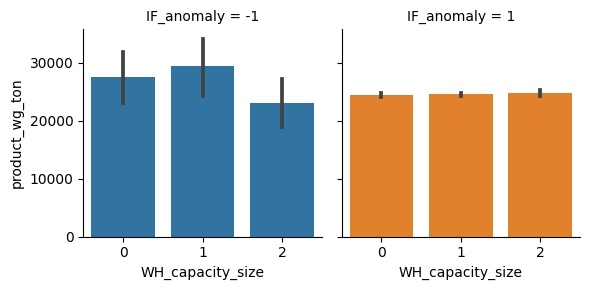

In [85]:
outlier_plot(cluster_df, 'Isolation Forest', 'WH_capacity_size', 'product_wg_ton', 'B')

In [86]:
cluster_df.query("IF_anomaly == 1").groupby('WH_capacity_size')['product_wg_ton'].agg(['mean', 'count'])

,mean,count
WH_capacity_size,,
0,24461.142482,4948
1,24546.627383,4879
2,24758.807622,2178


In [87]:
cluster_df.query("IF_anomaly == -1").groupby('WH_capacity_size')['product_wg_ton'].agg(['mean', 'count'])

,mean,count
WH_capacity_size,,
0,27588.628571,35
1,29413.833333,36
2,23005.666667,51


In [93]:
anomaly_pwt_cps = cluster_df.loc[(cluster_df['IF_anomaly'] == 1), ['WH_capacity_size', 'product_wg_ton']]
nanomaly_pwt_cps = cluster_df.loc[(cluster_df['IF_anomaly'] == -1), ['WH_capacity_size', 'product_wg_ton']]

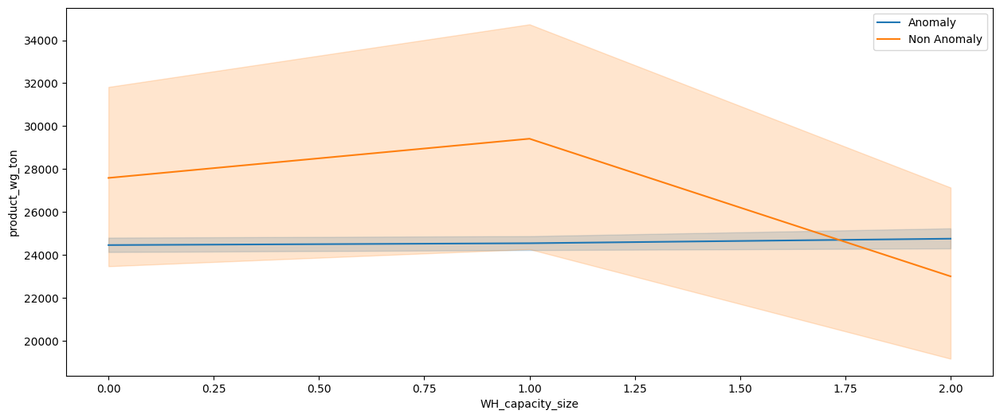

In [97]:
fig, ax = plt.subplots(figsize=(15, 6))
sns.lineplot(data=anomaly_pwt_cps, x='WH_capacity_size', y='product_wg_ton', label='Anomaly')
sns.lineplot(data=nanomaly_pwt_cps, x='WH_capacity_size', y='product_wg_ton', label='Non Anomaly')
plt.show()

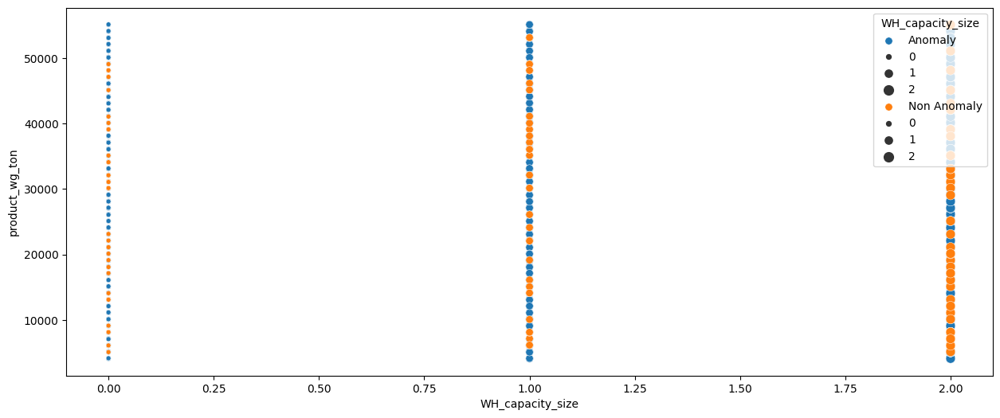

In [102]:
fig, ax = plt.subplots(figsize=(15, 6))
sns.scatterplot(data=anomaly_pwt_cps, x='WH_capacity_size', y='product_wg_ton', size='WH_capacity_size', label='Anomaly')
sns.scatterplot(data=nanomaly_pwt_cps, x='WH_capacity_size', y='product_wg_ton', size='WH_capacity_size', label='Non Anomaly')
plt.show()

Outlier Method Name: Isolation Forest
Number of anomalous value: 122
Number of non anomalous value: 12005
Total Number of values: 12127


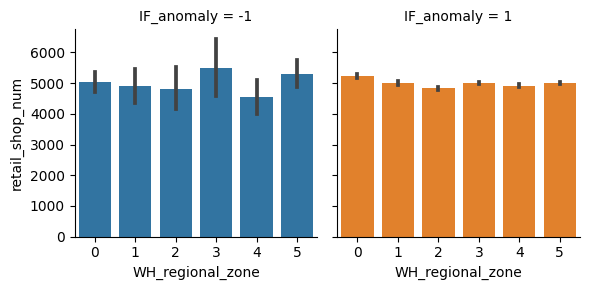

In [105]:
outlier_plot(cluster_df, 'Isolation Forest', 'WH_regional_zone', 'retail_shop_num', 'B')

In [106]:
anomaly_pwt_cps = cluster_df.loc[(cluster_df['IF_anomaly'] == 1), ['WH_regional_zone', 'retail_shop_num']]
nanomaly_pwt_cps = cluster_df.loc[(cluster_df['IF_anomaly'] == -1), ['WH_regional_zone', 'retail_shop_num']]

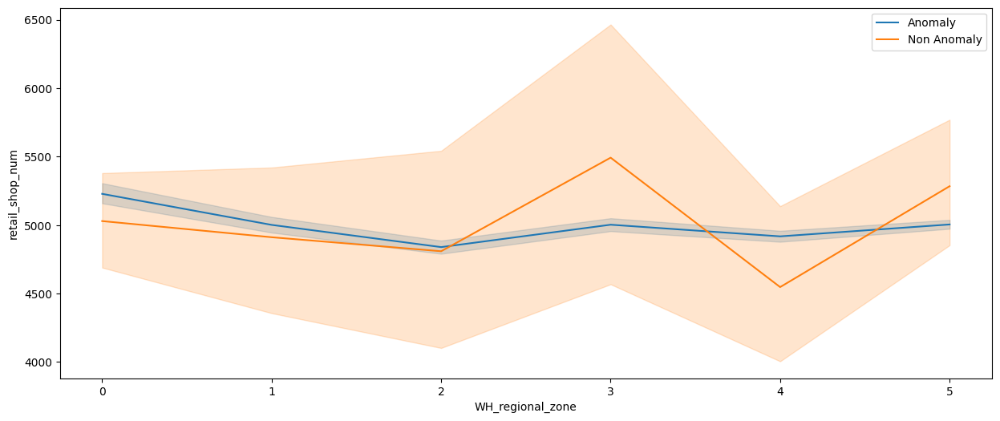

In [107]:
fig, ax = plt.subplots(figsize=(15, 6))
sns.lineplot(data=anomaly_pwt_cps, x='WH_regional_zone', y='retail_shop_num', label='Anomaly')
sns.lineplot(data=nanomaly_pwt_cps, x='WH_regional_zone', y='retail_shop_num', label='Non Anomaly')
plt.show()

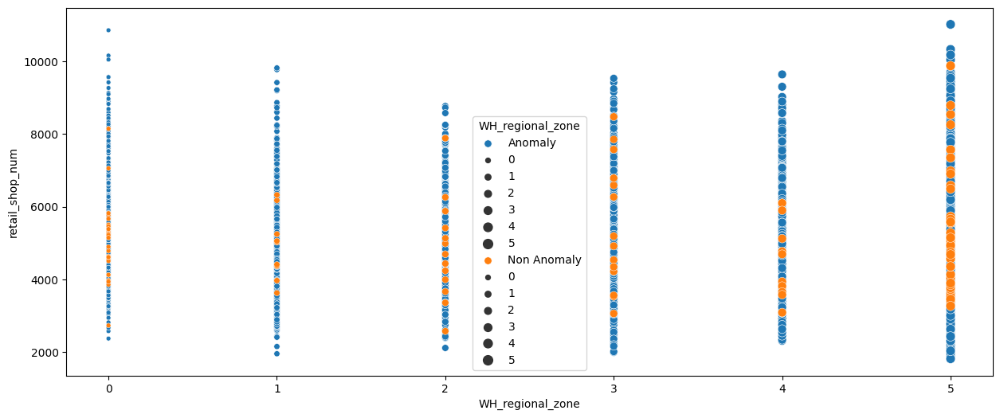

In [108]:
fig, ax = plt.subplots(figsize=(15, 6))
sns.scatterplot(data=anomaly_pwt_cps, x='WH_regional_zone', y='retail_shop_num', size='WH_regional_zone', label='Anomaly')
sns.scatterplot(data=nanomaly_pwt_cps, x='WH_regional_zone', y='retail_shop_num', size='WH_regional_zone', label='Non Anomaly')
plt.show()

<AxesSubplot:xlabel='WH_regional_zone', ylabel='retail_shop_num'>

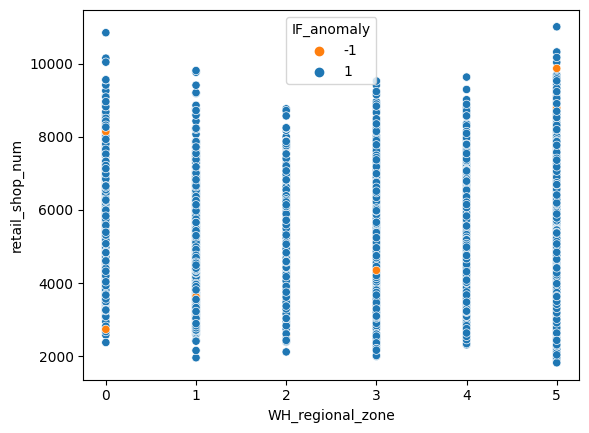

In [112]:
palette = ['#ff7f0e', '#1f77b4']
sns.scatterplot(data=cluster_df, x='WH_regional_zone', y='retail_shop_num', hue='IF_anomaly', palette=palette)

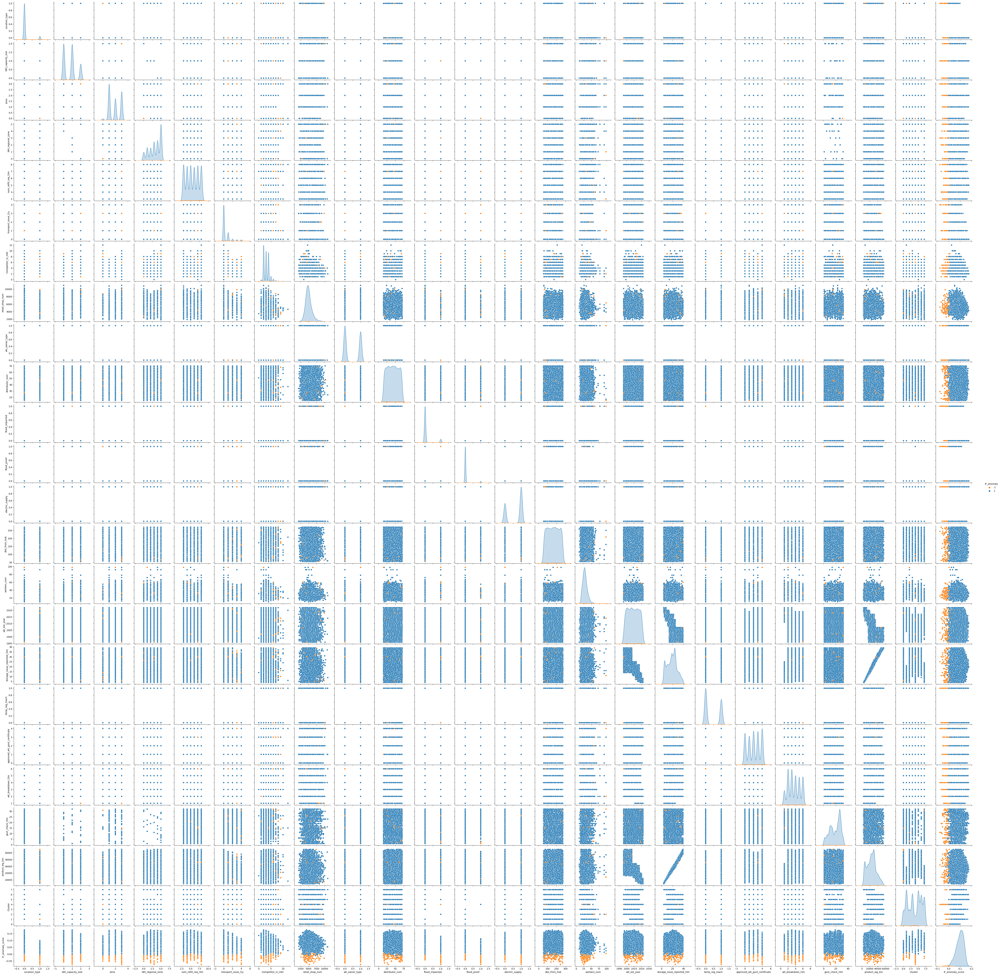

In [109]:
palette = ['#ff7f0e', '#1f77b4']
sns.pairplot(cluster_df, hue='IF_anomaly', palette=palette)

<AxesSubplot:xlabel='product_wg_ton', ylabel='Count'>

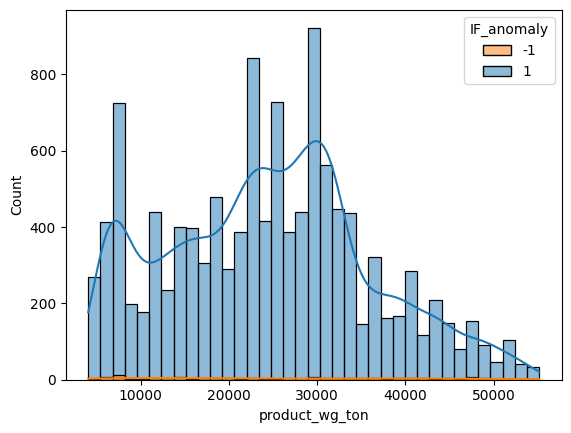

In [115]:
sns.histplot(data=cluster_df, x='product_wg_ton', hue='IF_anomaly', kde=True, palette=palette)

<AxesSubplot:xlabel='WH_regional_zone', ylabel='product_wg_ton'>

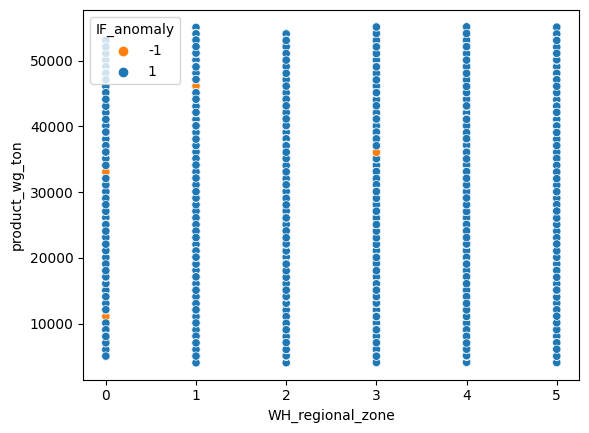

In [122]:
sns.scatterplot(data=cluster_df, x='WH_regional_zone', y='product_wg_ton', hue='IF_anomaly', palette=palette)

In [38]:
clf_lof = LocalOutlierFactor(n_neighbors=20, contamination=0.1)
y_pred_lof = clf_lof.fit_predict(cluster_df)

In [39]:
pd.Series(y_pred_lof).value_counts()

 1    10914
-1     1213
dtype: int64

In [40]:
print("LOF outlier scores:")
print(clf_lof.negative_outlier_factor_)

LOF outlier scores:
[-0.99893961 -0.9868009  -1.0215893  ... -0.98725149 -0.98620606
 -1.15080131]


In [41]:
cluster_df['LOC_anomaly'] = clf_lof.fit_predict(cluster_df)

In [42]:
clf_lof = LocalOutlierFactor(n_neighbors=20, contamination=0.1, novelty=True).fit(cluster_df)

In [43]:
cluster_df['LOC_anomaly_score'] = clf_lof.decision_function(cluster_df)

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LocalOutlierFactor was fitted with feature names
  warnings.warn(


In [44]:
cluster_df

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,...,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton,Cluster,IF_anomaly_score,IF_anomaly,LOC_anomaly,LOC_anomaly_score
0,0,0,1,4,3.0,1.0,2.0,4740.0,0,42.0,1.0,0.0,...,2009.0,18.0,0.0,4,6.0,24.0,24071.0,2,0.091398,1,1,0.194668
1,0,2,3,0,8.0,0.0,2.0,5053.0,1,37.0,0.0,0.0,...,2009.0,23.0,1.0,1,3.0,3.0,32134.0,5,0.081890,1,1,0.197990
2,0,0,3,5,8.0,0.0,4.0,4449.0,0,38.0,0.0,0.0,...,2010.0,24.0,0.0,2,3.0,6.0,30142.0,3,0.136081,1,1,0.160280
3,0,2,2,5,8.0,1.0,4.0,5381.0,1,42.0,0.0,0.0,...,2013.0,13.0,1.0,1,5.0,2.0,18082.0,3,0.087450,1,1,0.197823
4,0,0,1,5,7.0,1.0,3.0,4623.0,0,31.0,0.0,0.0,...,1999.0,17.0,0.0,3,4.0,6.0,21125.0,6,0.123738,1,1,0.196547
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12122,0,1,2,2,5.0,0.0,2.0,4591.0,1,33.0,0.0,0.0,...,2000.0,22.0,0.0,3,5.0,19.0,26091.0,5,0.147589,1,1,0.198437
12123,0,1,1,3,7.0,0.0,3.0,5242.0,1,41.0,0.0,0.0,...,2016.0,9.0,0.0,2,1.0,26.0,11083.0,7,0.102997,1,1,0.135411
12124,0,2,1,0,3.0,0.0,4.0,5390.0,1,19.0,0.0,0.0,...,2005.0,22.0,1.0,0,2.0,30.0,32093.0,5,0.064812,1,1,0.200503
12125,0,1,3,1,6.0,0.0,4.0,4490.0,0,57.0,0.0,0.0,...,2012.0,10.0,0.0,2,4.0,18.0,12114.0,1,0.132267,1,1,0.204669


In [157]:
def outlier_plot(data, outlier_method_name, x_var, y_var, plot='S'):
    print(f"Outlier Method Name: {outlier_method_name}")
    
    method = f'{outlier_method_name}_anomaly'
    print(f"Number of anomalous value: {len(data[data['LOC_anomaly'] == -1])}")
    print(f"Number of non anomalous value: {len(data[data['LOC_anomaly'] == 1])}")
    print(f"Total Number of values: {len(data)}")
    
    if plot == 'S':
        g = sns.FacetGrid(data, col='LOC_anomaly', height=4, hue='LOC_anomaly', hue_order=[1, -1])
        g.map(sns.scatterplot, x_var, y_var)
    elif plot == 'B':
        g = sns.FacetGrid(data, col='LOC_anomaly', hue='LOC_anomaly')
        g.map(sns.barplot, x_var, y_var, order=np.unique(df[x_var]))
    else:
        None
    return g

Outlier Method Name: Local Outlier Factor
Number of anomalous value: 1213
Number of non anomalous value: 10914
Total Number of values: 12127


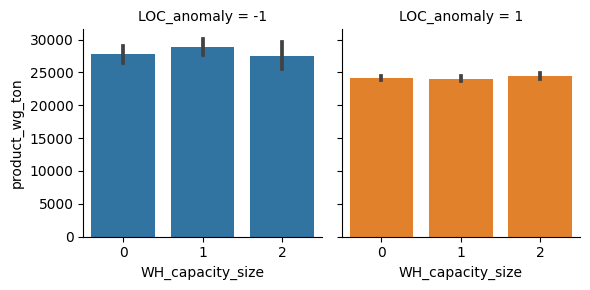

In [158]:
outlier_plot(cluster_df, 'Local Outlier Factor', 'WH_capacity_size', 'product_wg_ton', 'B')

In [45]:
n_neighbors = 20
knn = NearestNeighbors(n_neighbors=n_neighbors)
knn.fit(cluster_df)
distances, indices = knn.kneighbors(cluster_df)
clf_abod = ABOD(method='fast')
y_pred_abod = clf_abod.fit_predict(cluster_df)

print("\nABOD outlier scores:")
print(-clf_abod.decision_scores_)

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function fit_predict is deprecated
  warnings.warn(msg, category=FutureWarning)



ABOD outlier scores:
[8.18128323e-08 2.40384445e-08 2.06803741e-08 ... 4.08737662e-08
 4.27332766e-08 1.73352854e-09]


In [52]:
cluster_df['ABOS_anomaly'] = clf_abod.fit_predict(cluster_df)
#cluster_df['ABOS_decision_scores'] = clf_abod.decision_function(cluster_df)

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function fit_predict is deprecated
  warnings.warn(msg, category=FutureWarning)


In [168]:
def outlier_plot(data, outlier_method_name, x_var, y_var, plot='S'):
    print(f"Outlier Method Name: {outlier_method_name}")
    
    method = f'{outlier_method_name}_anomaly'
    print(f"Number of anomalous value: {len(data[data['ABOS_anomaly'] == -1])}")
    print(f"Number of non anomalous value: {len(data[data['ABOS_anomaly'] == 1])}")
    print(f"Total Number of values: {len(data)}")
    
    if plot == 'S':
        g = sns.FacetGrid(data, col='ABOS_anomaly', height=4, hue='ABOS_anomaly', hue_order=[1, -1])
        g.map(sns.scatterplot, x_var, y_var)
    elif plot == 'B':
        g = sns.FacetGrid(data, col='ABOS_anomaly', hue='ABOS_anomaly')
        g.map(sns.barplot, x_var, y_var, order=np.unique(df[x_var]))
    else:
        None
    return g

Outlier Method Name: ABOD Outlier
Number of anomalous value: 0
Number of non anomalous value: 1213
Total Number of values: 12127


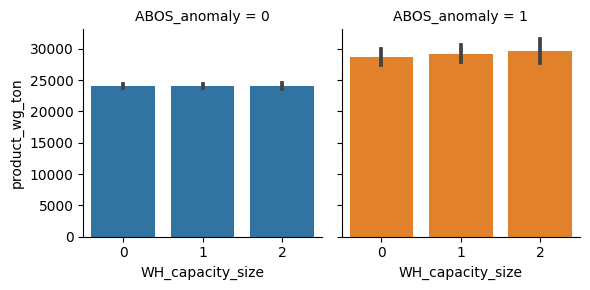

In [169]:
outlier_plot(cluster_df, 'ABOD Outlier', 'WH_capacity_size', 'product_wg_ton', 'B')

In [54]:
def IFS(x, a, b, c, d):
    mu = (x-a)/(b-a)
    nu = (d-x)/(d-c)
    lambda_ = 1 - mu - nu
    return [mu, nu, lambda_]

Q1 = cluster_df['workers_num'].quantile(0.25)
Q2 = cluster_df['workers_num'].quantile(0.5)
Q3 = cluster_df['workers_num'].quantile(0.75)
IQR = Q3 - Q1
a = Q1 - (1.5 * IQR)
b = Q3 + (1.5 * IQR)
c = (Q1 + Q3)/2
d = cluster_df['workers_num'].max()
membership_degrees = []
non_membership_degrees = []
for index, row in cluster_df.iterrows():
    [mu, nu, lambda_] = IFS(row['workers_num'], a, b, c, d)
    membership_degrees.append(mu)
    non_membership_degrees.append(nu)

membership_degrees = np.array(membership_degrees)
non_membership_degrees = np.array(non_membership_degrees)

mu_threshold = 0.5
nu_threshold = 0.5

anomalies = cluster_df[(membership_degrees < mu_threshold) & (non_membership_degrees < nu_threshold)]
nanomalies = cluster_df[~(membership_degrees < mu_threshold) & (non_membership_degrees < nu_threshold)]

print(anomalies)

Empty DataFrame
Columns: [Location_type, WH_capacity_size, zone, WH_regional_zone, num_refill_req_l3m, transport_issue_l1y, Competitor_in_mkt, retail_shop_num, wh_owner_type, distributor_num, flood_impacted, flood_proof, electric_supply, dist_from_hub, workers_num, wh_est_year, storage_issue_reported_l3m, temp_reg_mach, approved_wh_govt_certificate, wh_breakdown_l3m, govt_check_l3m, product_wg_ton, Cluster, IF_anomaly_score, IF_anomaly, LOC_anomaly, LOC_anomaly_score, ABOS_anomaly]
Index: []

[0 rows x 28 columns]


In [50]:
anomalies

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,...,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton,Cluster,IF_anomaly_score,IF_anomaly,LOC_anomaly,LOC_anomaly_score,ABOS_anomaly
40,0,1,2,3,7.0,0.0,2.0,4135.0,1,68.0,0.0,0.0,...,27.0,0.0,3,6.0,26.0,34108.0,5,0.108922,1,1,0.191396,0
61,0,2,3,0,4.0,0.0,4.0,5340.0,0,49.0,0.0,0.0,...,26.0,1.0,4,2.0,3.0,34129.0,3,0.046464,1,1,0.153477,0
108,1,1,2,3,3.0,0.0,2.0,3638.0,0,46.0,0.0,0.0,...,25.0,1.0,1,6.0,26.0,35063.0,0,0.058407,1,-1,-0.171171,0
113,0,2,1,0,8.0,0.0,3.0,4217.0,0,26.0,0.0,0.0,...,27.0,0.0,3,6.0,16.0,34147.0,5,0.079723,1,1,0.185687,0
128,0,0,1,5,7.0,0.0,4.0,4947.0,0,69.0,0.0,0.0,...,26.0,0.0,0,2.0,29.0,35118.0,6,0.076733,1,1,0.192030,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11906,0,2,1,5,3.0,0.0,4.0,7059.0,0,58.0,1.0,0.0,...,26.0,0.0,4,3.0,13.0,34086.0,2,0.068537,1,-1,-0.128664,1
12031,0,1,2,2,7.0,0.0,5.0,4573.0,0,52.0,0.0,0.0,...,25.0,1.0,0,4.0,27.0,35111.0,3,0.117206,1,1,0.201310,0
12104,0,1,2,2,3.0,1.0,2.0,6140.0,1,41.0,0.0,0.0,...,29.0,1.0,2,5.0,27.0,36081.0,5,0.089192,1,1,0.192547,0
12109,0,0,2,4,5.0,0.0,3.0,4081.0,1,66.0,0.0,0.0,...,28.0,0.0,3,3.0,14.0,35061.0,6,0.123177,1,1,0.187539,0


In [51]:
nanomalies

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,...,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton,Cluster,IF_anomaly_score,IF_anomaly,LOC_anomaly,LOC_anomaly_score,ABOS_anomaly
8,0,1,1,2,4.0,1.0,4.0,4598.0,1,58.0,0.0,0.0,...,29.0,1.0,1,5.0,27.0,38082.0,5,0.114138,1,1,0.175264,0
11,0,2,1,5,5.0,0.0,4.0,3588.0,0,69.0,0.0,0.0,...,28.0,1.0,4,6.0,8.0,40150.0,3,0.040099,1,-1,-0.013244,0
17,0,1,2,1,4.0,0.0,3.0,3559.0,0,51.0,0.0,0.0,...,34.0,0.0,0,4.0,12.0,45061.0,5,0.112571,1,-1,-0.167204,0
20,0,0,3,4,5.0,0.0,3.0,4031.0,0,59.0,0.0,0.0,...,34.0,0.0,2,5.0,14.0,42116.0,3,0.134719,1,1,0.084465,0
21,0,1,2,2,7.0,0.0,3.0,4243.0,0,23.0,0.0,0.0,...,38.0,0.0,2,2.0,19.0,47071.0,5,0.101176,1,-1,0.003081,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12095,0,1,1,1,4.0,0.0,3.0,3814.0,1,33.0,0.0,0.0,...,30.0,1.0,1,3.0,1.0,40096.0,5,0.091101,1,1,0.148240,0
12097,0,0,1,4,7.0,0.0,3.0,3479.0,0,66.0,0.0,0.0,...,28.0,0.0,4,3.0,17.0,38144.0,6,0.102151,1,-1,-0.093397,0
12111,0,1,3,3,4.0,0.0,3.0,4748.0,1,66.0,0.0,0.0,...,36.0,0.0,3,2.0,11.0,45133.0,3,0.106453,1,1,0.151739,0
12117,0,0,1,4,3.0,2.0,2.0,4984.0,1,41.0,0.0,0.0,...,31.0,1.0,4,3.0,17.0,41079.0,6,0.072238,1,1,0.183243,0


In [55]:
mean = np.mean(cluster_df['workers_num'])
std_dev = np.std(cluster_df['workers_num'])

upper_control_limit = mean + 3 * std_dev
lower_control_limit = mean - 3 * std_dev

out_of_control = cluster_df[(cluster_df['workers_num'] > upper_control_limit) | (cluster_df['workers_num'] < lower_control_limit)]
print(out_of_control)

       Location_type  WH_capacity_size  zone  WH_regional_zone  \
198                0                 0     3                 4   
428                0                 1     1                 2   
527                0                 1     2                 3   
538                0                 0     1                 4   
694                0                 1     2                 1   
...              ...               ...   ...               ...   
11881              0                 1     2                 1   
11948              0                 1     3                 3   
12019              0                 0     1                 4   
12023              1                 1     2                 2   
12100              0                 0     3                 5   

       num_refill_req_l3m  transport_issue_l1y  Competitor_in_mkt  \
198                   3.0                  0.0                4.0   
428                   8.0                  0.0                2.0   


In [56]:
pd.set_option('display.max_columns', 30)
out_of_control

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton,Cluster,IF_anomaly_score,IF_anomaly,LOC_anomaly,LOC_anomaly_score,ABOS_anomaly
198,0,0,3,4,3.0,0.0,4.0,3896.0,1,17.0,1.0,0.0,0.0,251.0,98.0,2009.0,16.0,1.0,3,4.0,14.0,21144.0,2,0.027432,1,1,0.167109,0
428,0,1,1,2,8.0,0.0,2.0,5773.0,0,32.0,0.0,0.0,1.0,73.0,55.0,2017.0,14.0,0.0,3,1.0,27.0,16090.0,1,0.092557,1,1,0.157934,0
527,0,1,2,3,5.0,0.0,2.0,5650.0,1,52.0,1.0,0.0,1.0,201.0,61.0,2005.0,25.0,0.0,0,2.0,26.0,32085.0,2,0.056887,1,1,0.182348,0
538,0,0,1,4,8.0,3.0,2.0,5214.0,1,41.0,0.0,0.0,1.0,216.0,54.0,2000.0,24.0,1.0,4,4.0,17.0,31101.0,6,0.055391,1,1,0.171358,0
694,0,1,2,1,3.0,0.0,2.0,5027.0,1,38.0,0.0,0.0,1.0,213.0,57.0,2015.0,13.0,0.0,0,6.0,32.0,17112.0,1,0.063253,1,1,0.190568,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11881,0,1,2,1,8.0,0.0,2.0,4988.0,1,23.0,0.0,0.0,1.0,170.0,56.0,2017.0,10.0,0.0,0,4.0,32.0,13059.0,1,0.069787,1,1,0.202094,0
11948,0,1,3,3,3.0,0.0,3.0,5036.0,0,48.0,0.0,0.0,1.0,56.0,58.0,2010.0,22.0,1.0,3,2.0,11.0,29063.0,3,0.087202,1,1,0.118645,0
12019,0,0,1,4,5.0,1.0,3.0,7068.0,1,25.0,0.0,0.0,1.0,219.0,61.0,2015.0,11.0,0.0,0,3.0,17.0,15110.0,1,0.062743,1,-1,-0.069665,1
12023,1,1,2,2,6.0,0.0,3.0,4175.0,0,62.0,0.0,0.0,1.0,230.0,55.0,2007.0,19.0,0.0,4,6.0,19.0,24118.0,0,0.042838,1,1,0.187703,0


<AxesSubplot:xlabel='Location_type', ylabel='count'>

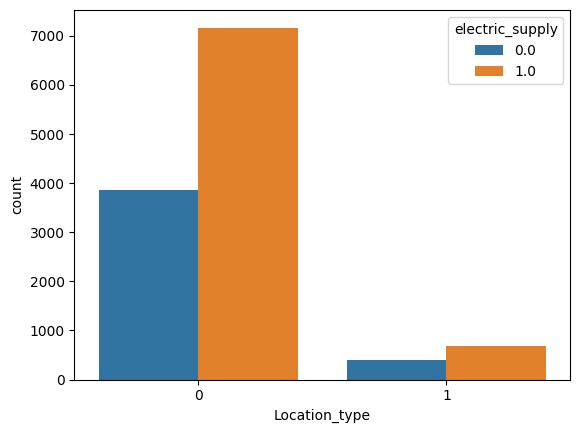

In [185]:
sns.countplot(data=cluster_df, x='Location_type', hue='electric_supply')